In [1]:
cd /Users/festabu/Desktop/ML_galaxy_size_project/Codes/simba/caesar

/Users/festabu/Desktop/ML_galaxy_size_project/Codes/simba/caesar


In [2]:
ls

Halo_spin_hist.jpeg  caesar/              readthedocs.yml
LICENSE              caesar.egg-info/     scripts/
README.rst           dist/                setup.py
build/               docs/                tests/


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as norm
import pandas as pd
from matplotlib.gridspec import SubplotSpec
from scipy import stats
from sklearn.linear_model import LinearRegression

import yt
import caesar as caesar
import seaborn as sns

/Users/festabu/opt/anaconda3/envs/festa_env/lib/python3.9/_collections_abc.py:684: MatplotlibDeprecationWarning: The global colormaps dictionary is no longer considered public API.
  self[key]


In [4]:
#snapnum,snapz=caesar.progen.z_to_snap(redshift=0)
# load in input file
obj = caesar.load('/Users/festabu/Desktop/ML_galaxy_size_project/Codes/simba/m100n1024_151.hdf5')

yt : [INFO     ] 2021-12-01 10:07:22,921 Opening /Users/festabu/Desktop/ML_galaxy_size_project/Codes/simba/m100n1024_151.hdf5
yt : [INFO     ] 2021-12-01 10:07:23,006 Found 464043 halos
yt : [INFO     ] 2021-12-01 10:07:23,036 Found 55609 galaxies


In [5]:
snapnum,snapz=caesar.progen.z_to_snap(redshift=0)

In [6]:
snapnum

151

In [7]:
snapz

0.0

In [8]:
obj.galaxies

In [9]:
len(obj.galaxies)

55609

### Define functions

In [10]:
def read_caesar(caesarfilename):
    '''Function that reads SIMBA files and outputs the fields in a data frame'''
    
    groups=caesar.load(caesarfilename)
    Ngal=len(groups.galaxies)
    idx=np.zeros(Ngal);cent=np.zeros(Ngal);sfr=np.zeros(Ngal);rdisk=np.zeros(Ngal)
    mHI=np.zeros(Ngal);mH2=np.zeros(Ngal);Mstar=np.zeros(Ngal);Mhalo=np.zeros(Ngal); Shalo=np.zeros(Ngal)
    
    for i,galaxy in enumerate(groups.galaxies):
        idx[i] = galaxy.GroupID
        cent[i] = (galaxy.central).astype(int)
        sfr[i] = galaxy.sfr
        rdisk[i]=galaxy.radii['stellar_half_mass']
        Mstar[i] = galaxy.masses['stellar']
        mHI[i] = galaxy.masses['HI']
        mH2[i] = galaxy.masses['H2'] 
        Mhalo[i]=galaxy.halo.masses['total']
        Shalo[i]=galaxy.halo.virial_quantities['spin_param']
    
    df=pd.DataFrame({'GID':idx,'central':cent,'galaxy_mass':Mstar,'galaxy_size':rdisk, 'SFR':sfr,'mHI':mHI,'mH2':mH2,
        'Mhalo':Mhalo, 'Shalo' : Shalo})
    
    return df

In [11]:
def log_mass_size(df):
    '''
    Converts to log10 non-zero size and mass entries (without distinguishing galaxy type)
    output: df with new columns of log mass, log size added to it

    '''
    #first let's remove all galaxy_mass=0 since you are going to at the end anyway
    df=df[df['galaxy_mass'] > 0]

#     #subhalo_flag = subhalos[‘SubhaloFlag’]
#     if type_of_galaxy == 'central':
#         df=df[df['subhalo_flag']==True]
#     elif type_of_galaxy == 'satellite':
#         df=df[df['subhalo_flag']==False]
#     else: 
#         print("type_of_galaxy must be set to central or satellite")

    #since we got rid of all zero mass we can just take the log10
    df['galaxy_mass_log']=np.log10(df['galaxy_mass'])
    df['galaxy_size_log']=np.log10(df['galaxy_size'])

    return df

In [12]:
def log_SFR(df):
    '''
    Converts to log10 non-zero SFR entries (without distinguishing galaxy type)
    output: df with new columns of log SFR added to it

    '''
    #first let's remove all galaxy_mass=0 since you are going to at the end anyway
    df=df[df['SFR'] > 0]

    #since we got rid of all zero mass we can just take the log10
    df['SFR_log']=np.log10(df['SFR'])

    return df

In [13]:
# function to return the base 10 logarithm of non-zero values
def return_log(row, col):
    if(row[col]!= 0):
        return np.log10(row[col])
    else:
        return 0

In [14]:
# function to return the base 10 logarithm of non-zero values
def return_log_SFR(row, col):
    if(row[col]!= 0):
        return np.log10(row[col])
    else:
        return -3

In [15]:
def create_subtitle(fig: plt.Figure, grid: SubplotSpec, title: str):
    "Sign sets of subplots with title"
    row = fig.add_subplot(grid)
    # the '\n' is important
    row.set_title(f'{title}\n', fontweight='semibold')
    # hide subplot
    row.set_frame_on(False)
    row.axis('off')

### Define data frame

In [16]:
df_SIMBA = read_caesar('/Users/festabu/Desktop/ML_galaxy_size_project/Codes/simba/m100n1024_151.hdf5')

yt : [INFO     ] 2021-12-01 10:07:41,140 Opening /Users/festabu/Desktop/ML_galaxy_size_project/Codes/simba/m100n1024_151.hdf5
yt : [INFO     ] 2021-12-01 10:07:41,234 Found 464043 halos
yt : [INFO     ] 2021-12-01 10:07:41,263 Found 55609 galaxies


In [17]:
df_SIMBA.head(2) # total of 55,609 row entries (galaxies)

,GID,central,galaxy_mass,galaxy_size,SFR,mHI,mH2,Mhalo,Shalo
0,0.0,1.0,4.464625e+12,25.092316,0.000000,1.416904e+10,1.109349e+09,1.060091e+15,inf
1,1.0,1.0,4.116048e+12,11.327452,32.495613,4.860084e+09,2.554619e+10,4.434884e+14,0.002251


In [18]:
# remove the 807 infinity entries from Shalo column (halo spin); all the 807 infinity entries belong to satellite galaxies
df_SIMBA = df_SIMBA.loc[df_SIMBA.Shalo<np.inf,:]

In [19]:
df_SIMBA.shape

(54802, 9)

In [20]:
df_SIMBA['central'].value_counts()

1.0    35841
0.0    18961
Name: central, dtype: int64

In [21]:
# add a column that labels galaxy type
df_SIMBA['galaxy_type'] = df_SIMBA.apply(lambda row: 'central' if row['central']==True else 'satellite', axis=1)


In [22]:
#df_SIMBA.dtypes

In [23]:
df_SIMBA['galaxy_type'].value_counts()

central      35841
satellite    18961
Name: galaxy_type, dtype: int64

### Logarithmic scale of size, mass, SFR and Mhalo

In [24]:
df_SIMBA_log=log_mass_size(df_SIMBA)

In [25]:
df_SIMBA_log.head(2)

,GID,central,galaxy_mass,galaxy_size,SFR,mHI,mH2,Mhalo,Shalo,galaxy_type,galaxy_mass_log,galaxy_size_log
1,1.0,1.0,4.116048e+12,11.327452,32.495613,4.860084e+09,2.554619e+10,4.434884e+14,0.002251,central,12.614480,1.054132
2,2.0,1.0,1.952101e+12,14.278415,0.000000,4.645089e+09,2.795169e+08,6.903581e+14,0.002041,central,12.290502,1.154680


In [26]:
# add a column with the logarithmic value of SFR
df_SIMBA_log['SFR_log'] = df_SIMBA_log.apply(lambda row: return_log_SFR(row, 'SFR'), axis=1)

In [27]:
df_SIMBA_log['Mhalo_log'] = df_SIMBA_log.apply(lambda row: return_log(row, 'Mhalo'), axis=1)

In [28]:
df_SIMBA_log.head(2)

,GID,central,galaxy_mass,galaxy_size,SFR,mHI,mH2,Mhalo,Shalo,galaxy_type,galaxy_mass_log,galaxy_size_log,SFR_log,Mhalo_log
1,1.0,1.0,4.116048e+12,11.327452,32.495613,4.860084e+09,2.554619e+10,4.434884e+14,0.002251,central,12.614480,1.054132,1.511825,14.646882
2,2.0,1.0,1.952101e+12,14.278415,0.000000,4.645089e+09,2.795169e+08,6.903581e+14,0.002041,central,12.290502,1.154680,-3.000000,14.839074


#### Galaxies in the mass range [9,11]

In [29]:
# choose only galaxies that have a mass of logMstar>9 and logMstar<11
df_SIMBA_largebin = df_SIMBA_log.loc[(df_SIMBA_log.galaxy_mass_log>=9.0) 
                                          & (df_SIMBA_log.galaxy_mass_log<11.0)
                                          , :] 

In [30]:
((df_SIMBA_log.galaxy_mass_log>=9.0) & (df_SIMBA_log.galaxy_mass_log<=11.0)).sum()

33946

In [31]:
df_SIMBA_largebin.galaxy_mass_log.max()

10.999060942761673

In [32]:
df_SIMBA_largebin.galaxy_mass_log.min()

9.0000100338238

In [33]:
df_SIMBA_largebin.shape

(33946, 14)

In [34]:
np.count_nonzero(df_SIMBA_log['galaxy_size_log']) # this means that there are no size zero entries in Simba

54802

#### Galaxies in smaller mass bins

In [35]:
np.linspace(9,11,11)

array([ 9. ,  9.2,  9.4,  9.6,  9.8, 10. , 10.2, 10.4, 10.6, 10.8, 11. ])

In [36]:
massbin_list = np.linspace(9,11,11)

In [37]:
df_SIMBA_log

,GID,central,galaxy_mass,galaxy_size,SFR,mHI,mH2,Mhalo,Shalo,galaxy_type,galaxy_mass_log,galaxy_size_log,SFR_log,Mhalo_log
1,1.0,1.0,4.116048e+12,11.327452,32.495613,4.860084e+09,2.554619e+10,4.434884e+14,0.002251,central,12.614480,1.054132,1.511825,14.646882
2,2.0,1.0,1.952101e+12,14.278415,0.000000,4.645089e+09,2.795169e+08,6.903581e+14,0.002041,central,12.290502,1.154680,-3.000000,14.839074
4,4.0,1.0,1.433810e+12,16.883629,0.000000,2.346815e+09,2.084681e+08,1.409975e+14,0.003263,central,12.156492,1.227466,-3.000000,14.149211
5,5.0,1.0,1.413366e+12,16.799601,0.000000,4.524431e+09,2.510553e+08,6.404380e+14,0.003573,central,12.150255,1.225299,-3.000000,14.806477
6,6.0,1.0,1.158755e+12,30.062649,2.469266,4.631708e+09,1.976497e+09,1.489077e+14,0.003232,central,12.063992,1.478027,0.392568,14.172917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55604,55604.0,0.0,2.613188e+08,4.515059,0.000000,1.703623e+00,0.000000e+00,1.087991e+14,0.012787,satellite,8.417171,0.654663,-3.000000,14.036625
55605,55605.0,0.0,2.611491e+08,3.707688,0.000000,3.065291e-02,0.000000e+00,6.404380e+14,0.003573,satellite,8.416889,0.569103,-3.000000,14.806477
55606,55606.0,0.0,2.610782e+08,3.546892,0.000000,1.451338e-01,0.000000e+00,6.903581e+14,0.002041,satellite,8.416771,0.549848,-3.000000,14.839074
55607,55607.0,0.0,2.610179e+08,2.542438,0.000000,0.000000e+00,0.000000e+00,6.929859e+13,0.003264,satellite,8.416670,0.405250,-3.000000,13.840724


## Correlations for individual massbins

In [217]:
def correlations_function(massbin, plot_type):
    # choose only galaxies that have a mass of logMstar>9.0 and logMstar<9.2
    
    if massbin[0]==9.0:
        df_SIMBA_bin = df_SIMBA_log.loc[(df_SIMBA_log.galaxy_mass_log>=massbin[0]) 
                                          & (df_SIMBA_log.galaxy_mass_log<=massbin[1]), :] 
    else:
        df_SIMBA_bin = df_SIMBA_log.loc[(df_SIMBA_log.galaxy_mass_log>massbin[0]) 
                                          & (df_SIMBA_log.galaxy_mass_log<=massbin[1]), :] 




    central_SIMBA = df_SIMBA_bin.loc[df_SIMBA_bin["galaxy_type"] == 'central',["galaxy_mass_log","galaxy_size_log",'SFR_log', 'mHI', 'mH2', 'Mhalo_log', 'Shalo']]
    print(central_SIMBA.shape)
    central_galaxies_mass=central_SIMBA["galaxy_mass_log"]
    central_galaxies_size=central_SIMBA["galaxy_size_log"]
    central_galaxies_SFR=central_SIMBA["SFR_log"]
    central_galaxies_mHI=central_SIMBA["mHI"]
    central_galaxies_mH2=central_SIMBA["mH2"]
    central_galaxies_Mhalo=central_SIMBA["Mhalo_log"]
    central_galaxies_Shalo=central_SIMBA["Shalo"]

    satellite_SIMBA = df_SIMBA_bin.loc[df_SIMBA_bin["galaxy_type"] == 'satellite', 
                                             ["galaxy_mass_log","galaxy_size_log",'SFR_log', 'mHI', 'mH2', 'Mhalo_log', 'Shalo']]
    satellite_galaxies_mass=satellite_SIMBA["galaxy_mass_log"]
    satellite_galaxies_size=satellite_SIMBA["galaxy_size_log"]
    satellite_galaxies_SFR=satellite_SIMBA["SFR_log"]
    satellite_galaxies_mHI=satellite_SIMBA["mHI"]
    satellite_galaxies_mH2=satellite_SIMBA["mH2"]
    satellite_galaxies_Mhalo=satellite_SIMBA["Mhalo_log"]
    satellite_galaxies_Shalo=satellite_SIMBA["Shalo"]

    mass_size_corr_central = round(stats.spearmanr(central_galaxies_mass, central_galaxies_size)[0], 2)
    SFR_size_corr_central = round(stats.spearmanr(central_galaxies_SFR, central_galaxies_size )[0], 2)
    SFR_mass_corr_central = round(stats.spearmanr(central_galaxies_SFR, central_galaxies_mass )[0], 2)

    mass_size_corr_satellite = round(stats.spearmanr(satellite_galaxies_mass, satellite_galaxies_size )[0], 2)
    SFR_size_corr_satellite = round(stats.spearmanr(satellite_galaxies_SFR, satellite_galaxies_size )[0], 2)
    SFR_mass_corr_satellite = round(stats.spearmanr(satellite_galaxies_SFR, satellite_galaxies_mass )[0], 2)

    fig4,[ax1, ax2]=plt.subplots(nrows=1,ncols=2,figsize=(15,5))
    fig4.suptitle('SIMBA: Size and SFR in the mass range {}'.format(massbin), fontsize=16, fontweight='bold')
    label = 'Galaxy Mass [$ M_\odot $]($ Log_{} $) \n mass-size corr={} \n SFR-size corr={} \n SFR-mass corr={}'.format(10, mass_size_corr_central,SFR_size_corr_central,SFR_mass_corr_central )
    print(label)
    im1 = ax1.scatter(central_galaxies_size, central_galaxies_SFR, 
                      c = (central_galaxies_mass), cmap = plt.cm.jet, s=3, marker='.', alpha=0.7, vmin=massbin[0], vmax=massbin[1],label=label)
    ax1.set_xlim([0.0, 1.2])
    ax1.set_ylim([-3.0, 1.1])
    ax1.set_title('SIMBA: Central Galaxies Size, SFR and Mass')
    ax1.set_xlabel('Galaxy Size [kpc]($ Log_{10} $)')
    ax1.set_ylabel('Star Formation Rate [$M_\odot / yr$]')
    ax1.legend(loc='lower right', shadow=True)
    fig4.colorbar(im1, ax=ax1)

    label = 'Galaxy Mass [$ M_\odot $]($ Log_10 $) \n mass-size corr={} \n SFR-size corr={} \n SFR-mass corr={}'.format(mass_size_corr_satellite,SFR_size_corr_satellite,SFR_mass_corr_satellite )
    im2 = ax2.scatter(satellite_galaxies_size, satellite_galaxies_SFR, 
                      c = (satellite_galaxies_mass), cmap = plt.cm.jet, s=3, marker='.', alpha=0.7, vmin=massbin[0], vmax=massbin[1],
                      label= label)
    ax2.set_xlim([0.0, 1.2])
    ax2.set_ylim([-3.0, 1.1])
    ax2.set_title('SIMBA: Satellite Galaxies Size, SFR and Mass')
    ax2.set_xlabel('Galaxy Size [kpc]($ Log_{10} $)')
    ax2.set_ylabel('Star Formation Rate [$M_\odot / yr$]')
    ax2.legend(loc='lower right' , shadow=True)
    fig4.colorbar(im2, ax=ax2)

    # plt.savefig("SIMBA_central_satellite_SFR_Mstar9_0to9_2_v3.jpeg", dpi=500)
    # plt.show()
#     fig3,[ax1]=plt.subplots(nrows=1,ncols=1,figsize=(15,5))
#     fig3.suptitle('SIMBA: Mass, Size and SFR', fontsize=16, fontweight='bold')

    fig3,[ax1, ax2]=plt.subplots(nrows=1,ncols=2,figsize=(15,5))
    fig3.suptitle('SIMBA: Mass, Size and SFR', fontsize=16, fontweight='bold')

    im1 = ax1.scatter(central_galaxies_mass, central_galaxies_size, 
                      c = (central_galaxies_SFR), cmap = plt.cm.jet, s=3, marker='.', alpha=0.5, vmin=-2, vmax=1.5,
                      label='Star Formation Rate [$M_\odot / yr$] \n mass-size corr=0.90 \n SFR-size corr=-0.20 \n SFR-mass corr=-0.03')
    ax1.set_xlim([8.0, 12.5])
    ax1.set_ylim([-0.2, 1.4])
    ax1.set_title('SIMBA: Central Galaxies Size, Mass and SFR')
    ax1.set_xlabel('Galaxy Mass [$ M_\odot $]($ Log_{10} $)')
    ax1.set_ylabel('Galaxy Size [kpc]($ Log_{10} $)')
    ax1.legend(loc='lower right', shadow=True)
    fig3.colorbar(im1, ax=ax1)

    im2 = ax2.scatter(satellite_galaxies_mass, satellite_galaxies_size, 
                      c = (satellite_galaxies_SFR), cmap = plt.cm.jet, s=3, marker='.', alpha=0.5, vmin=-2, vmax=1.5,
                      label='Star Formation Rate [$M_\odot / yr$] \n mass-size corr=0.90 \n SFR-size corr=0.05 \n SFR-mass corr=0.09')
    ax2.set_xlim([8.0, 12.5])
    ax2.set_ylim([-0.2, 1.4])
    ax2.set_title('SIMBA: Satellite Galaxies Size, Mass and SFR')
    ax2.set_xlabel('Galaxy Mass [$ M_\odot $]($ Log_{10} $)')
    ax2.set_ylabel('Galaxy Size [kpc]($ Log_{10} $)')
    ax2.legend(loc='lower right' , shadow=True)
    fig3.colorbar(im2, ax=ax2)

    plot1=sns.pairplot(central_SIMBA, kind=plot_type, corner=True)
    plot1.fig.suptitle("SIMBA Central Galaxies in the mass bin {}".format(massbin), y=1.03, fontsize=20) # y= some height>1
#     plot1.map_lower(plt.scatter, alpha=0.6)
#     plot1.map_diag(plt.hist, alpha=0.7)
#     plot1.map_upper(sns.kdeplot, shade=True)
    # plt.savefig("plot1_hist.jpeg", dpi=500)
    plot2=sns.pairplot(satellite_SIMBA, kind=plot_type)
    plot2.fig.suptitle("SIMBA Satellite Galaxies in the mass bin {}".format(massbin), y=1.03, fontsize=20) #
#     plot2.map_lower(sns.kdeplot, levels=4, color=".2")
    
    return fig4, plot1, plot2, central_SIMBA, satellite_SIMBA, fig3




In [203]:
massbin_list

array([ 9. ,  9.2,  9.4,  9.6,  9.8, 10. , 10.2, 10.4, 10.6, 10.8, 11. ])

(3200, 7)
Galaxy Mass [$ M_\odot $]($ Log_10 $) 
 mass-size corr=0.13 
 SFR-size corr=-0.41 
 SFR-mass corr=0.22


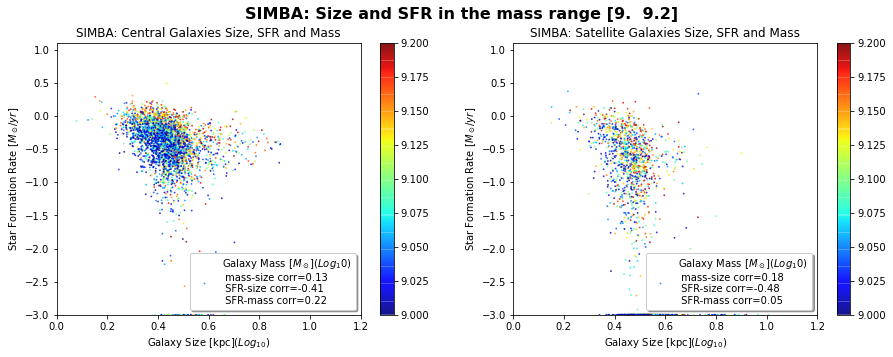

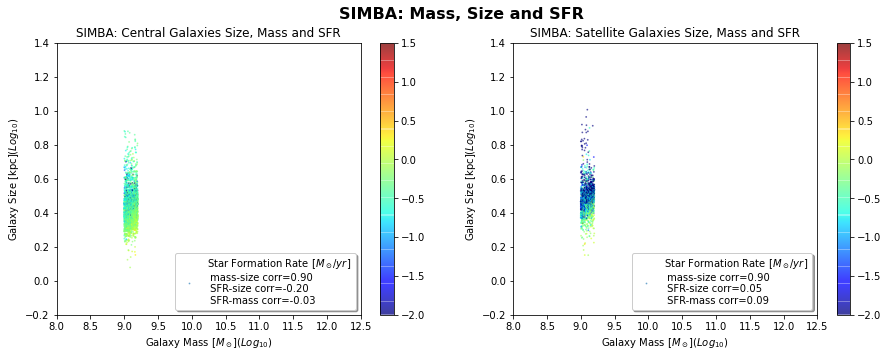

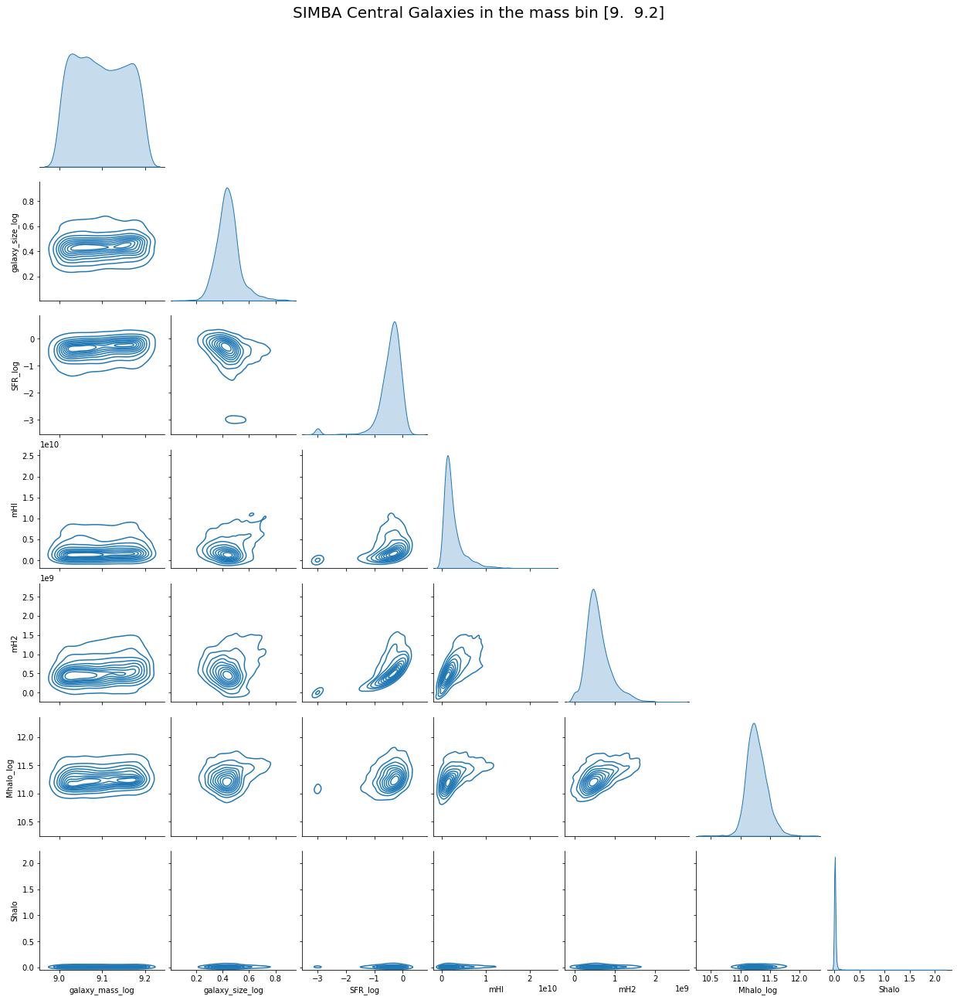

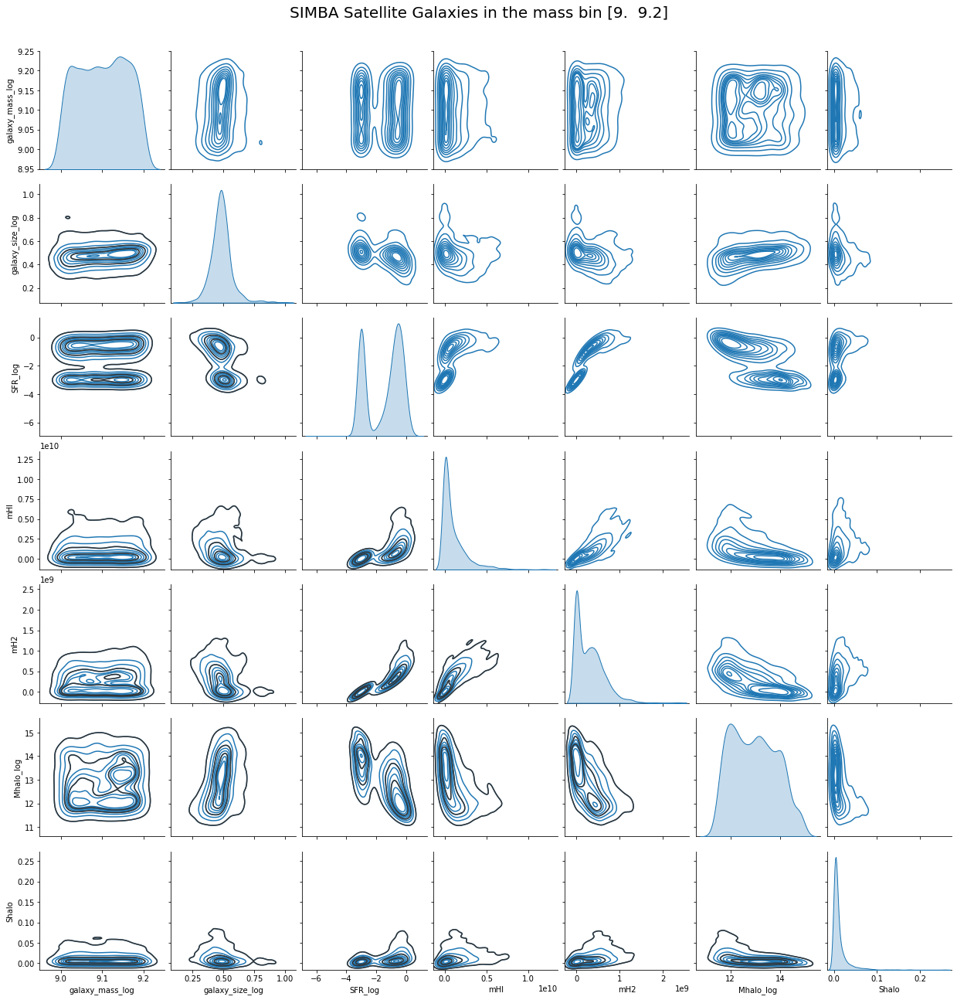

In [218]:
bin1=correlations_function(massbin_list[:2], 'kde')

In [44]:
fig1_1 = bin1[0]
fig1_2=bin1[1]
fig1_3=bin1[2]
# fig1_1.savefig("bin1_SIMBA_central_satellite_scatter.jpeg", dpi=500 )
# fig1_2.savefig("bin1_SIMBA_central_pairplot.jpeg", dpi=500 )
# fig1_3.savefig("bin1_SIMBA_satellite_pairplot.jpeg", dpi=500 )

(2844, 7)
Galaxy Mass [$ M_\odot $]($ Log_10 $) 
 mass-size corr=0.14 
 SFR-size corr=-0.49 
 SFR-mass corr=0.22


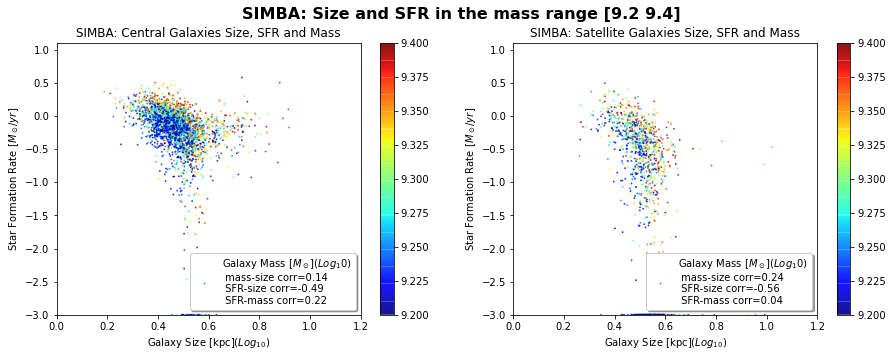

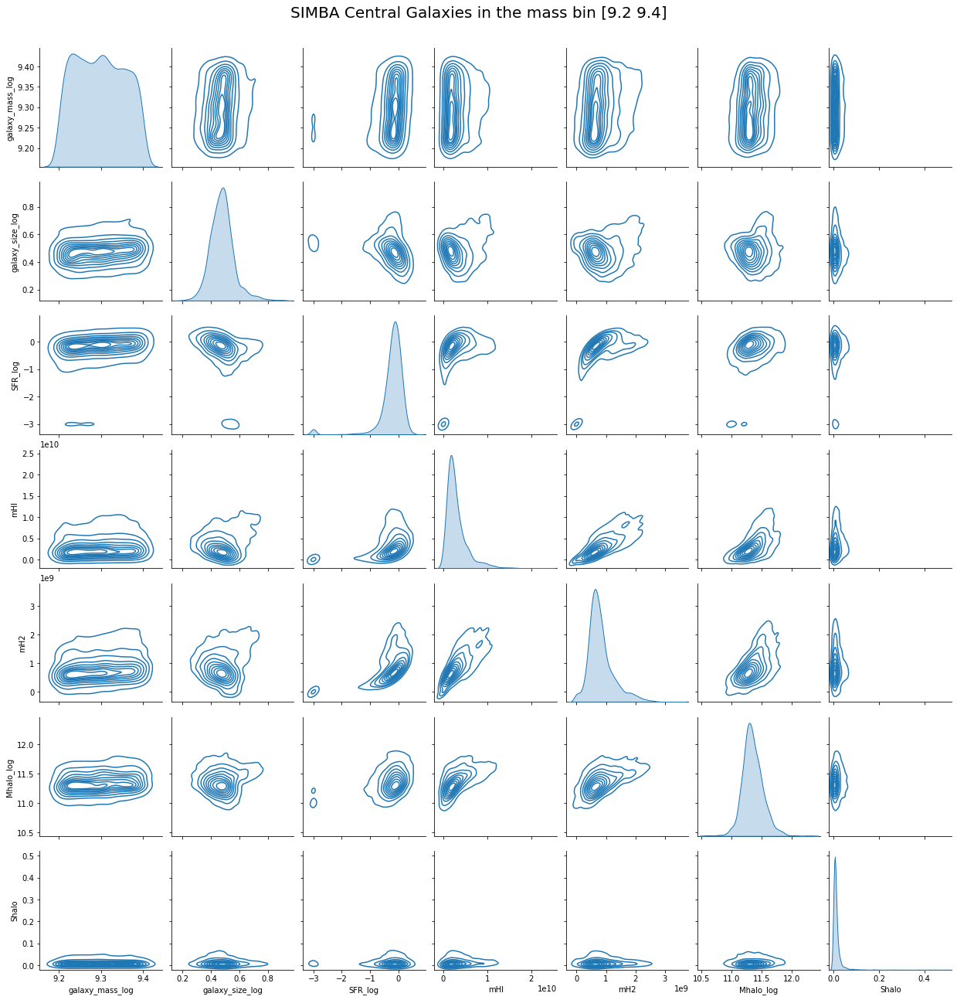

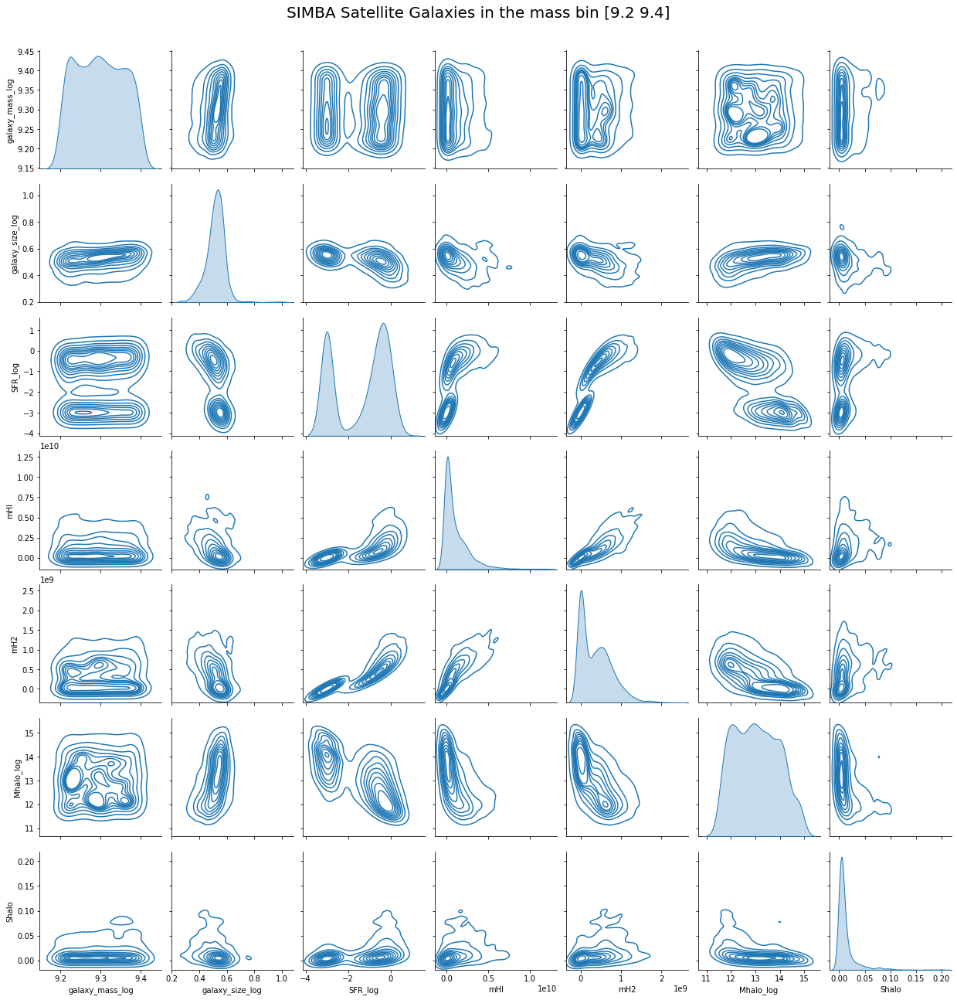

In [45]:
bin2=correlations_function(massbin_list[1:3], 'kde')

In [46]:
bin2[3].shape

(2844, 7)

In [47]:
bin2[4].shape

(1401, 7)

In [48]:
fig2_1 = bin2[0]
fig2_2=bin2[1]
fig2_3=bin2[2]
# fig2_1.savefig("bin2_SIMBA_central_satellite_scatter.jpeg", dpi=500 )
# fig2_2.savefig("bin2_SIMBA_central_pairplot.jpeg", dpi=500 )
# fig2_3.savefig("bin2_SIMBA_satellite_pairplot.jpeg", dpi=500 )

(3431, 7)
Galaxy Mass [$ M_\odot $]($ Log_10 $) 
 mass-size corr=0.38 
 SFR-size corr=-0.67 
 SFR-mass corr=-0.18


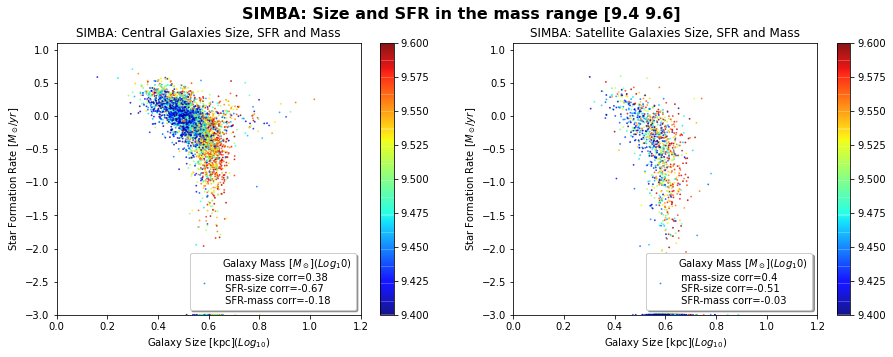

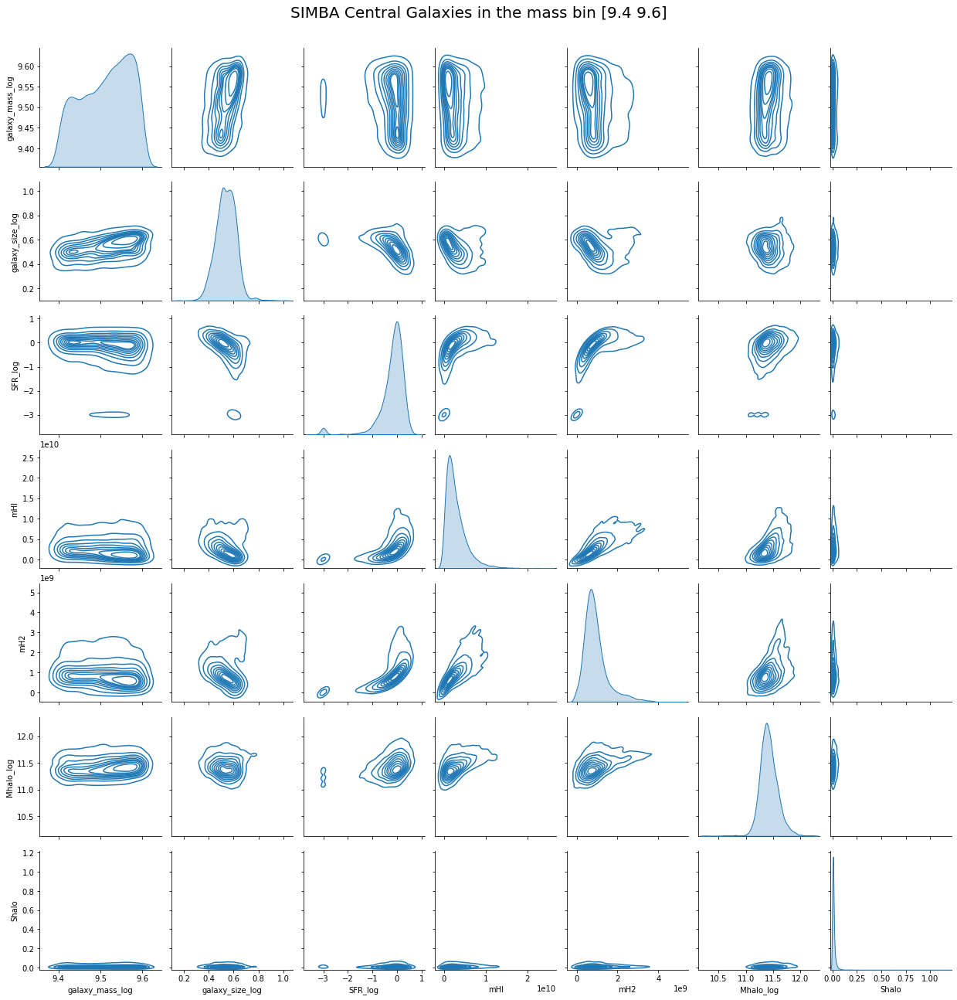

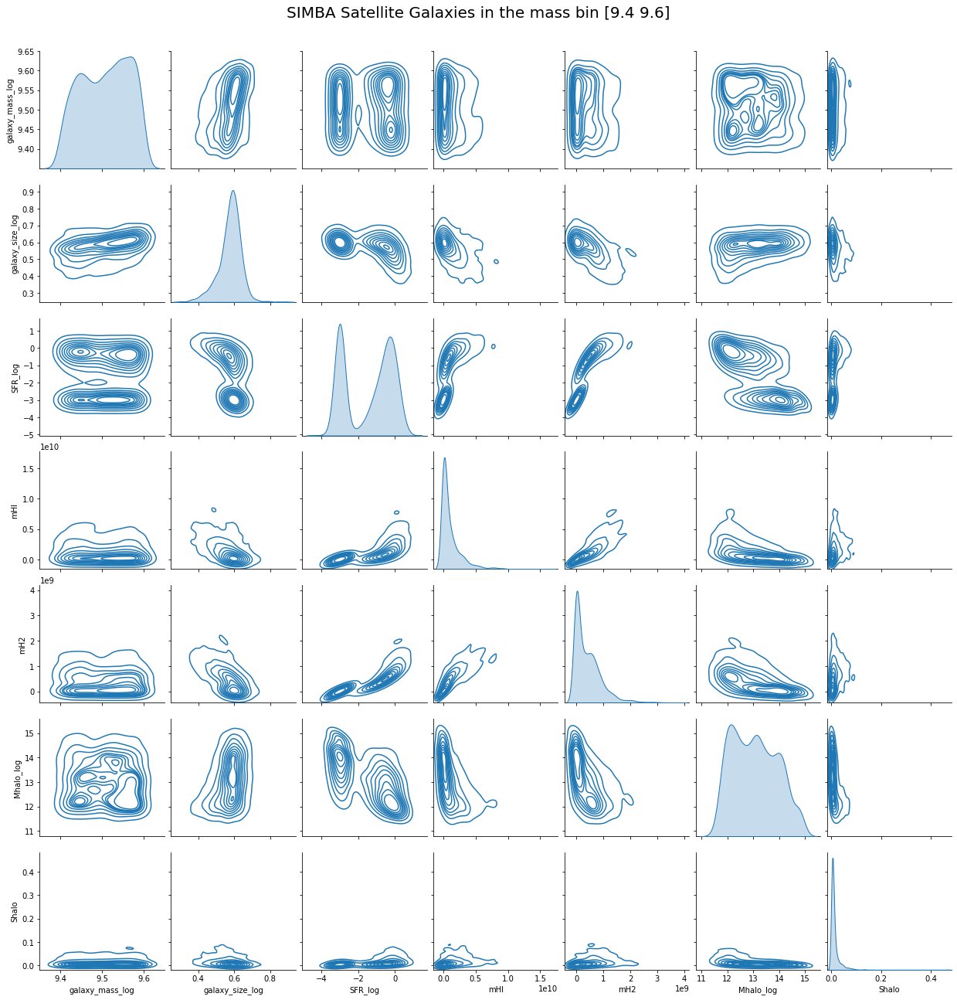

In [49]:
bin3=correlations_function(massbin_list[2:4], 'kde')

In [50]:
bin3[3].shape

(3431, 7)

In [51]:
bin3[4].shape

(1618, 7)

In [52]:
fig3_1 = bin3[0]
fig3_2=bin3[1]
fig3_3=bin3[2]
# fig3_1.savefig("bin3_SIMBA_central_satellite_scatter.jpeg", dpi=500 )
# fig3_2.savefig("bin3_SIMBA_central_pairplot.jpeg", dpi=500 )
# fig3_3.savefig("bin3_SIMBA_satellite_pairplot.jpeg", dpi=500 )

(4388, 7)
Galaxy Mass [$ M_\odot $]($ Log_10 $) 
 mass-size corr=0.4 
 SFR-size corr=-0.6 
 SFR-mass corr=-0.1


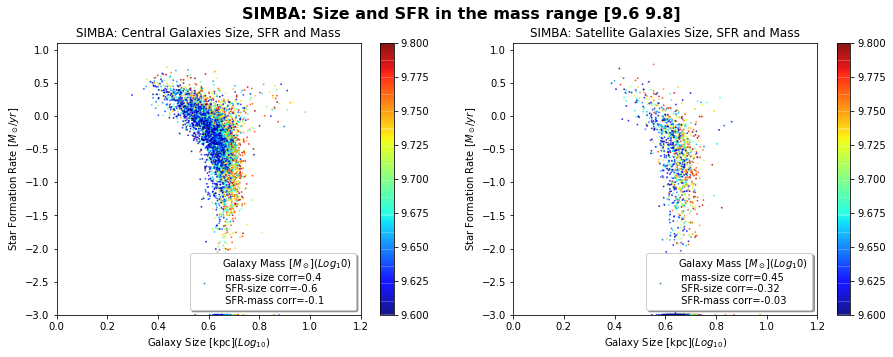

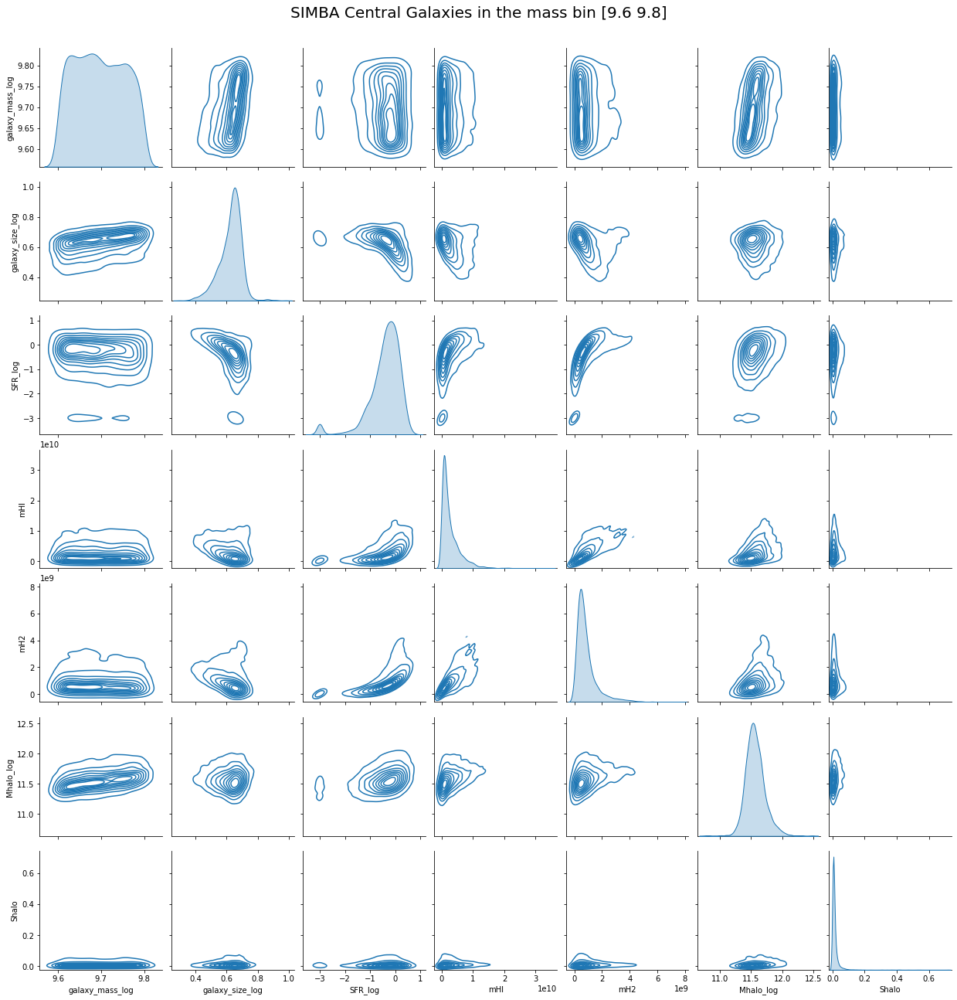

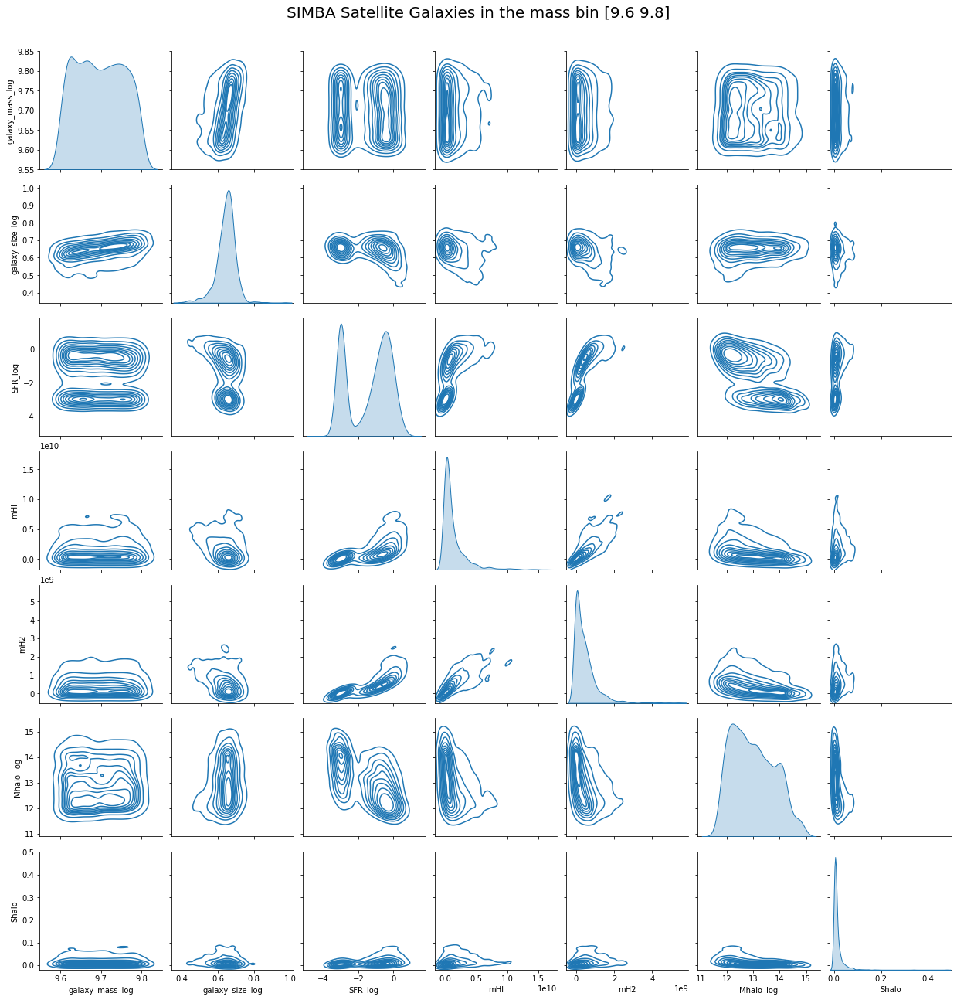

In [53]:
bin4=correlations_function(massbin_list[3:5], 'kde')

In [54]:
bin4[3].shape

(4388, 7)

In [55]:
bin4[4].shape

(1712, 7)

In [56]:
fig4_1 = bin4[0]
fig4_2=bin4[1]
fig4_3=bin4[2]
# fig4_1.savefig("bin4_SIMBA_central_satellite_scatter.jpeg", dpi=500 )
# fig4_2.savefig("bin4_SIMBA_central_pairplot.jpeg", dpi=500 )
# fig4_3.savefig("bin4_SIMBA_satellite_pairplot.jpeg", dpi=500 )

(3004, 7)
Galaxy Mass [$ M_\odot $]($ Log_10 $) 
 mass-size corr=0.35 
 SFR-size corr=-0.37 
 SFR-mass corr=-0.03


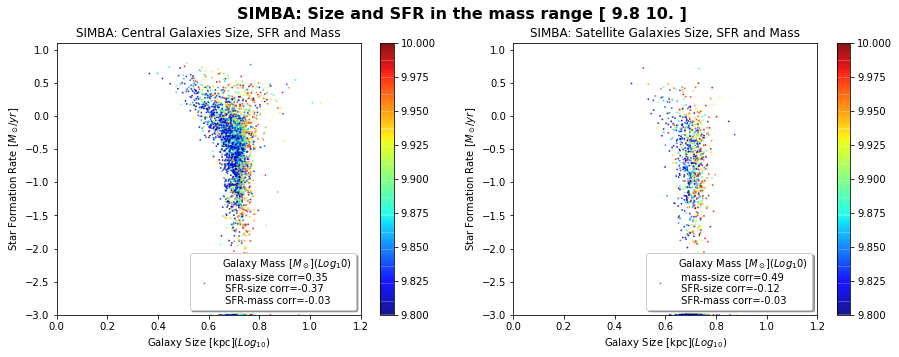

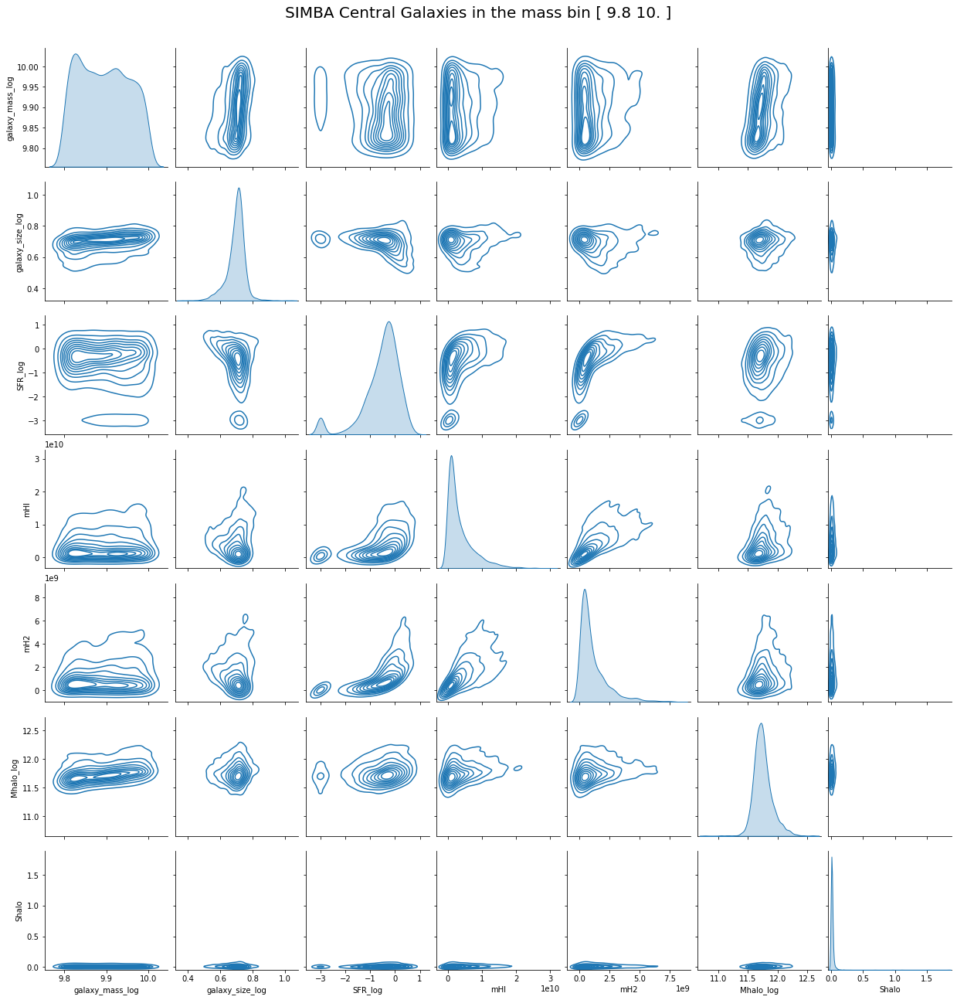

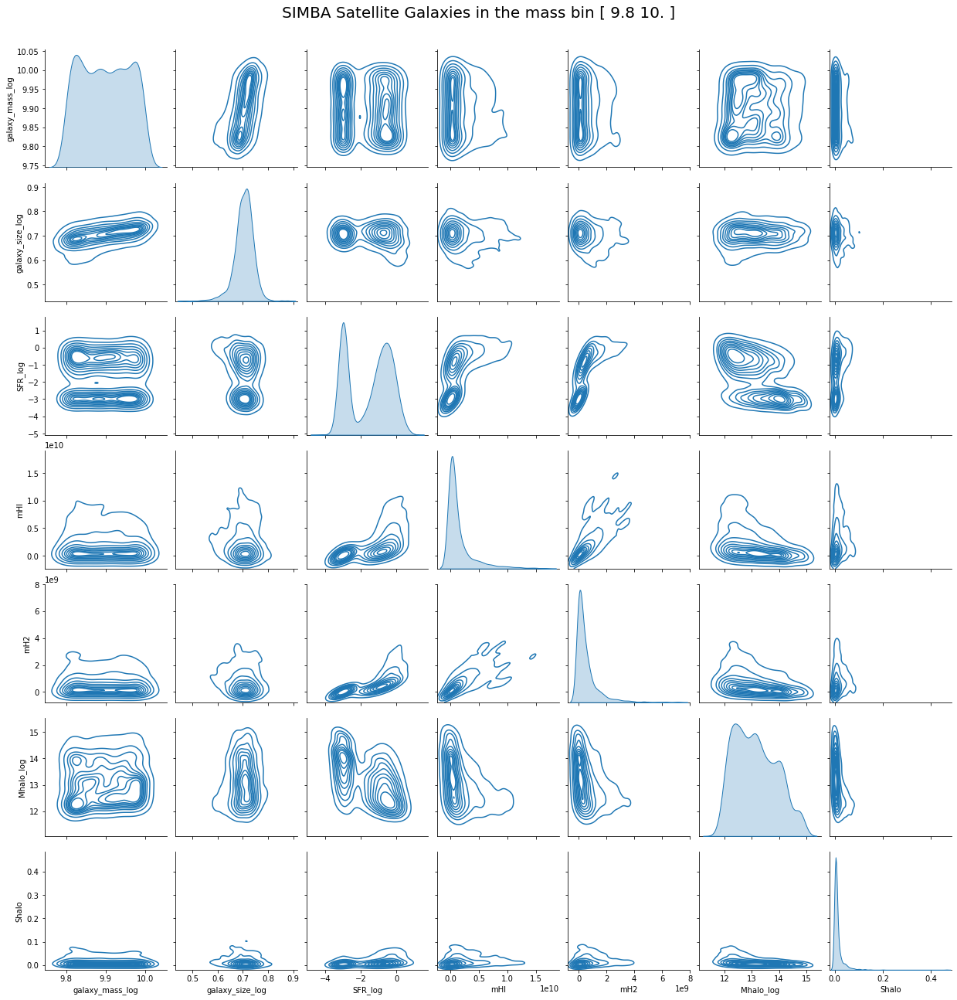

In [57]:
bin5=correlations_function(massbin_list[4:6], 'kde')

In [58]:
bin5[3].shape

(3004, 7)

In [59]:
bin5[4].shape

(1339, 7)

In [60]:
fig5_1 = bin5[0]
fig5_2=bin5[1]
fig5_3=bin5[2]
# fig5_1.savefig("bin5_SIMBA_central_satellite_scatter.jpeg", dpi=500 )
# fig5_2.savefig("bin5_SIMBA_central_pairplot.jpeg", dpi=500 )
# fig5_3.savefig("bin5_SIMBA_satellite_pairplot.jpeg", dpi=500 )

In [61]:
massbin_list[5:7]

array([10. , 10.2])

(2424, 7)
Galaxy Mass [$ M_\odot $]($ Log_10 $) 
 mass-size corr=0.35 
 SFR-size corr=-0.28 
 SFR-mass corr=-0.07


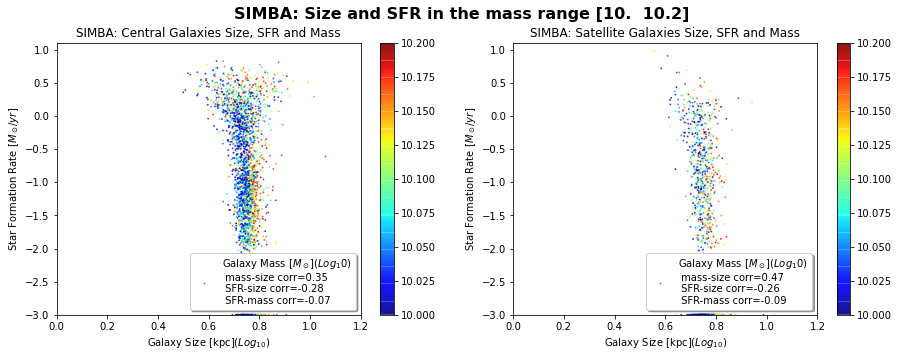

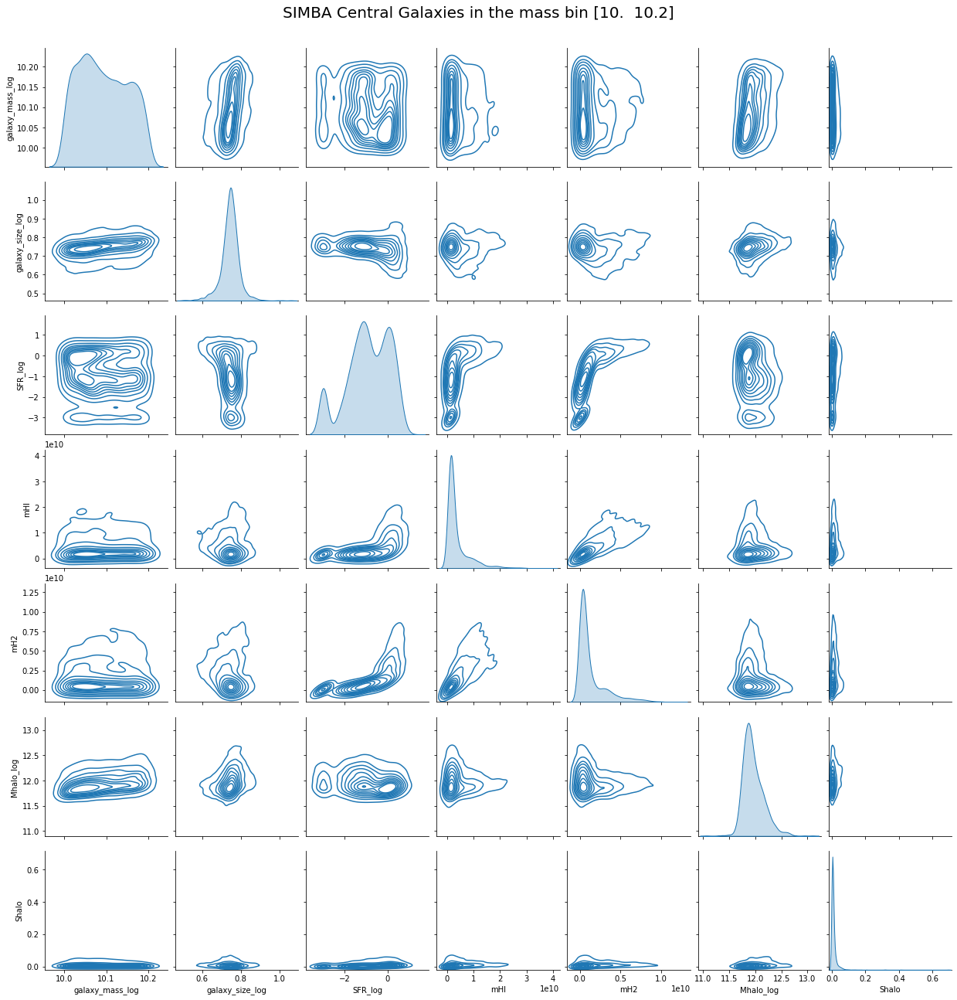

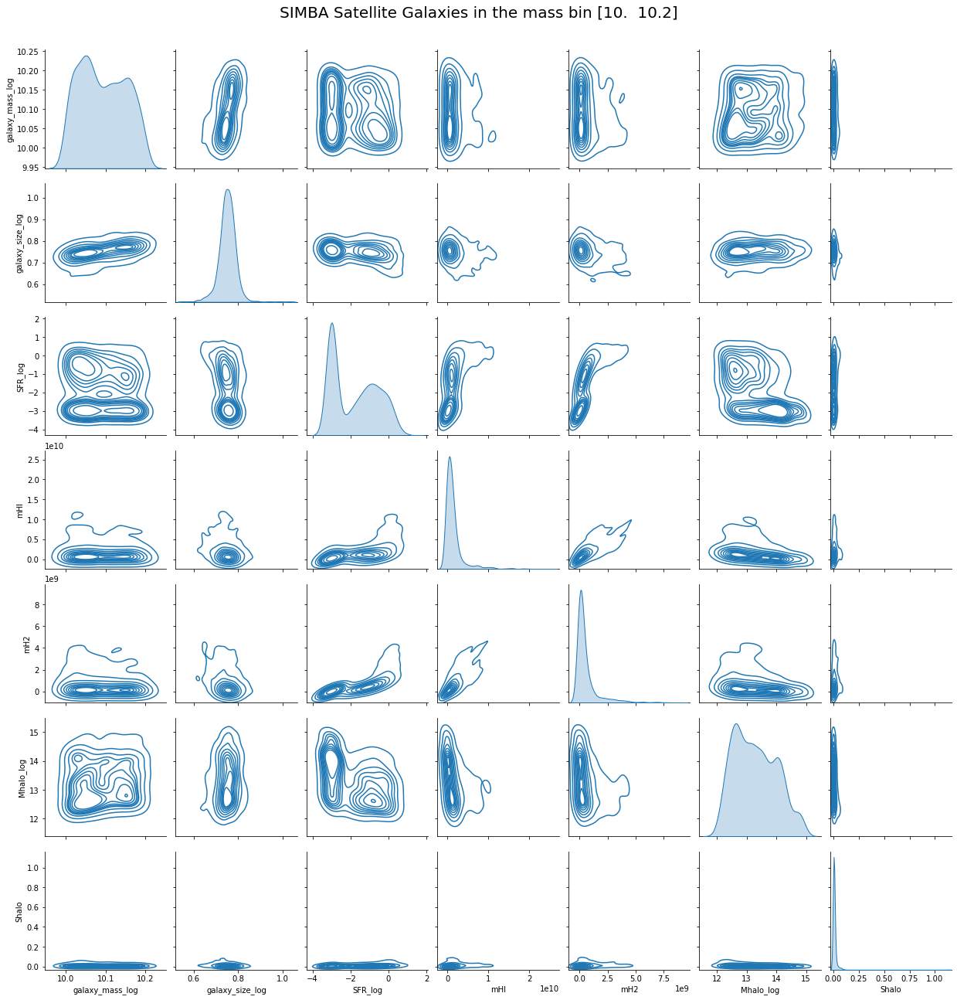

In [62]:
bin6=correlations_function(massbin_list[5:7], 'kde')

In [63]:
bin6[3].shape

(2424, 7)

In [64]:
bin6[4].shape

(1149, 7)

In [65]:
fig6_1 = bin6[0]
fig6_2=bin6[1]
fig6_3=bin6[2]
# fig6_1.savefig("bin6_SIMBA_central_satellite_scatter.jpeg", dpi=500 )
# fig6_2.savefig("bin6_SIMBA_central_pairplot.jpeg", dpi=500 )
# fig6_3.savefig("bin6_SIMBA_satellite_pairplot.jpeg", dpi=500 )

In [66]:
massbin_list[6:8]

array([10.2, 10.4])

(1581, 7)
Galaxy Mass [$ M_\odot $]($ Log_10 $) 
 mass-size corr=0.26 
 SFR-size corr=-0.38 
 SFR-mass corr=-0.04


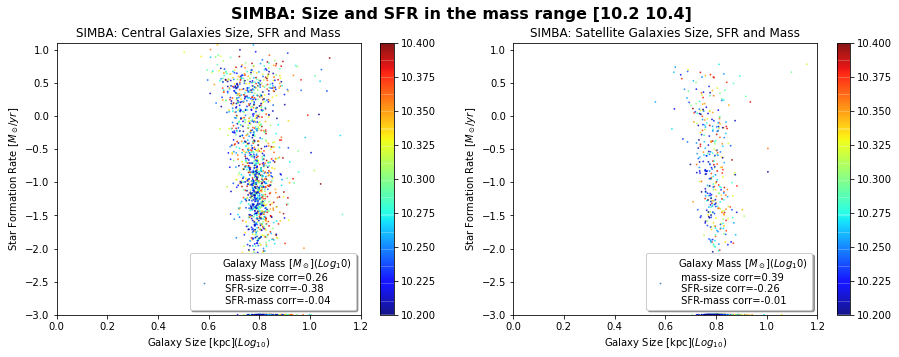

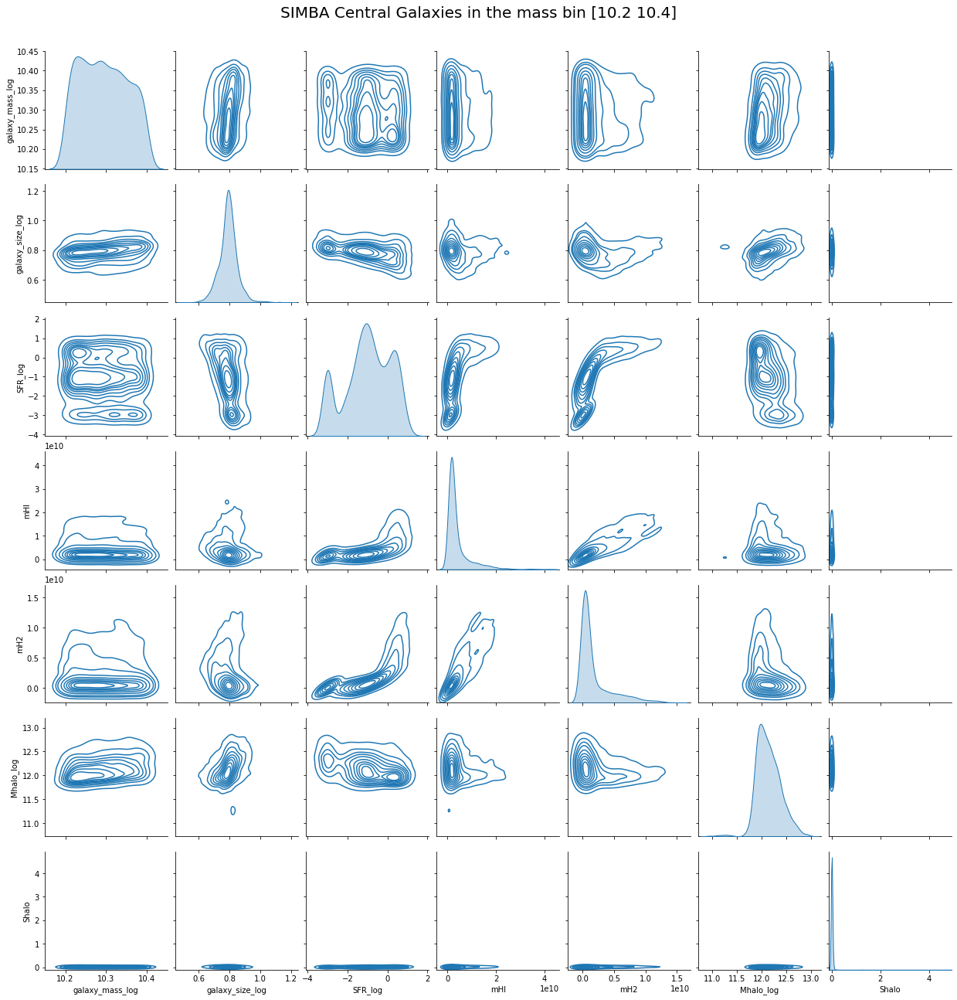

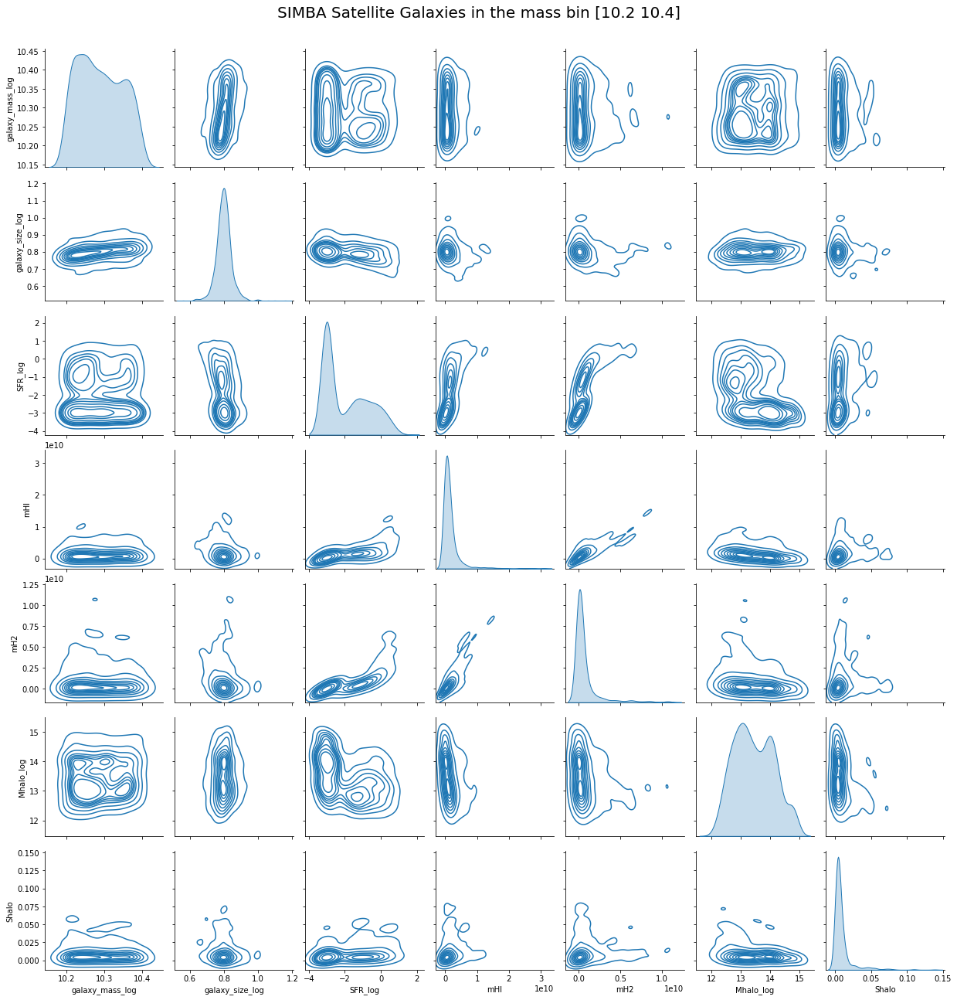

In [67]:
bin7=correlations_function(massbin_list[6:8], 'kde')

In [68]:
bin7[3].shape

(1581, 7)

In [69]:
bin7[4].shape

(776, 7)

In [70]:
fig7_1 = bin7[0]
fig7_2=bin7[1]
fig7_3=bin7[2]
# fig7_1.savefig("bin7_SIMBA_central_satellite_scatter.jpeg", dpi=500 )
# fig7_2.savefig("bin7_SIMBA_central_pairplot.jpeg", dpi=500 )
# fig7_3.savefig("bin7_SIMBA_satellite_pairplot.jpeg", dpi=500 )

In [71]:
massbin_list[7:9]

array([10.4, 10.6])

(1004, 7)
Galaxy Mass [$ M_\odot $]($ Log_10 $) 
 mass-size corr=0.26 
 SFR-size corr=-0.42 
 SFR-mass corr=-0.05


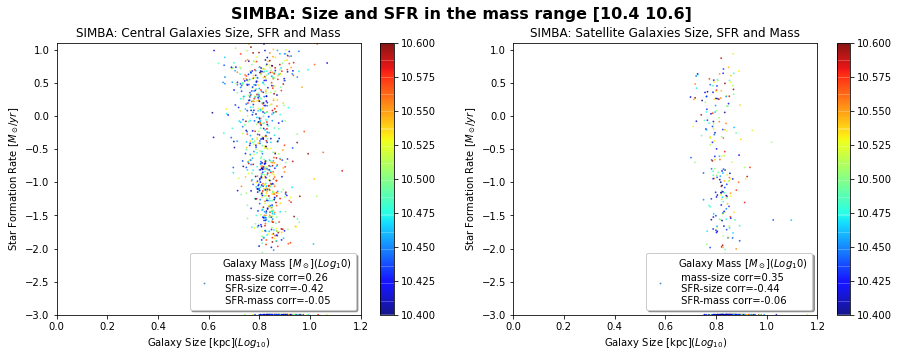

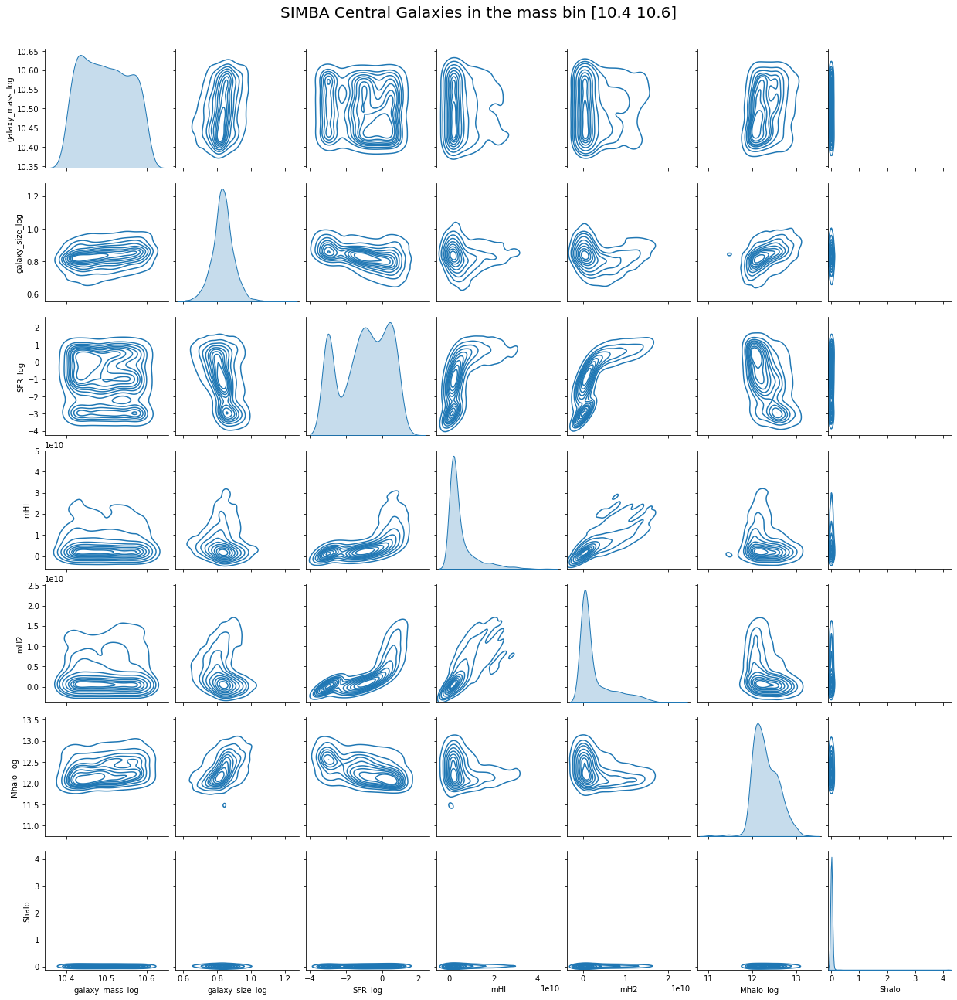

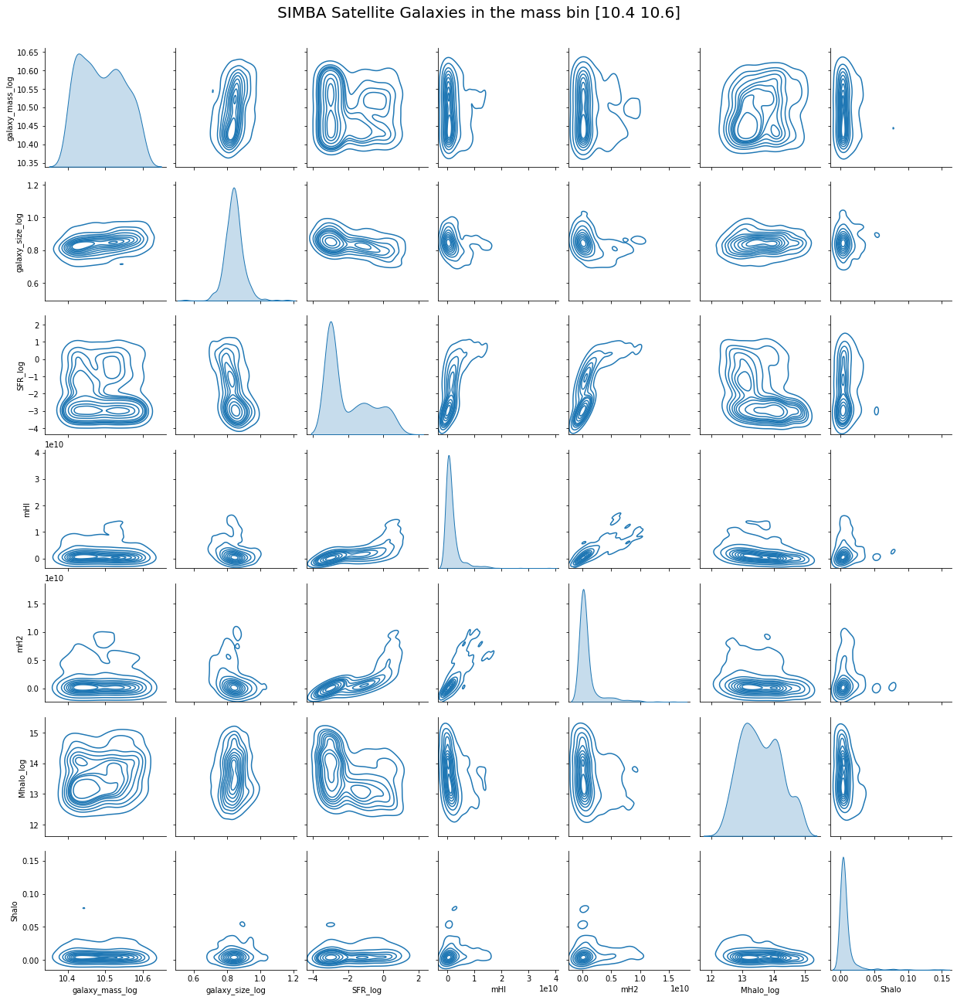

In [72]:
bin8=correlations_function(massbin_list[7:9], 'kde')

In [73]:
bin8[3].shape

(1004, 7)

In [74]:
bin8[4].shape

(508, 7)

In [75]:
fig8_1 = bin8[0]
fig8_2=bin8[1]
fig8_3=bin8[2]
# fig8_1.savefig("bin8_SIMBA_central_satellite_scatter.jpeg", dpi=500 )
# fig8_2.savefig("bin8_SIMBA_central_pairplot.jpeg", dpi=500 )
# fig8_3.savefig("bin8_SIMBA_satellite_pairplot.jpeg", dpi=500 )

In [76]:
massbin_list[8:10]

array([10.6, 10.8])

(772, 7)
Galaxy Mass [$ M_\odot $]($ Log_10 $) 
 mass-size corr=0.16 
 SFR-size corr=-0.48 
 SFR-mass corr=0.02


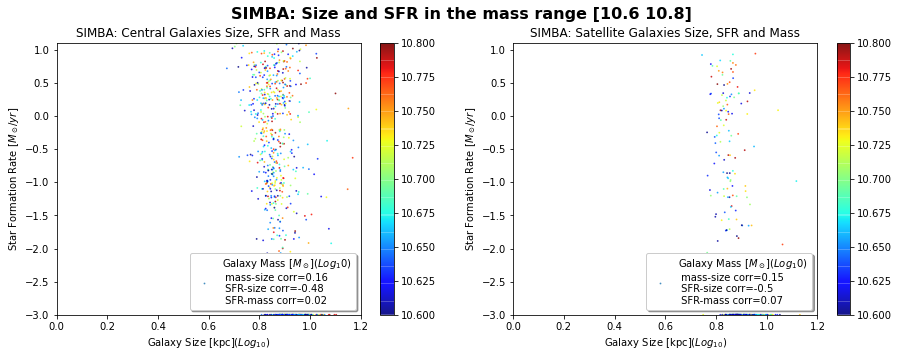

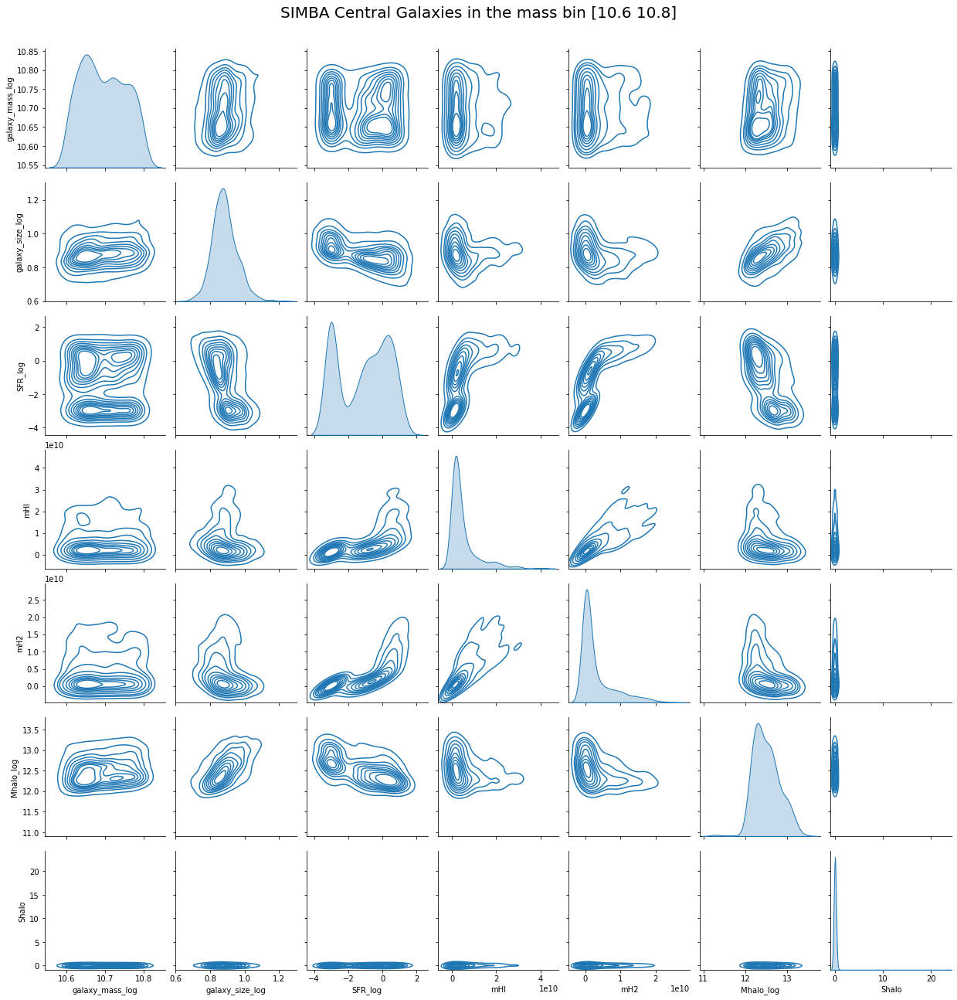

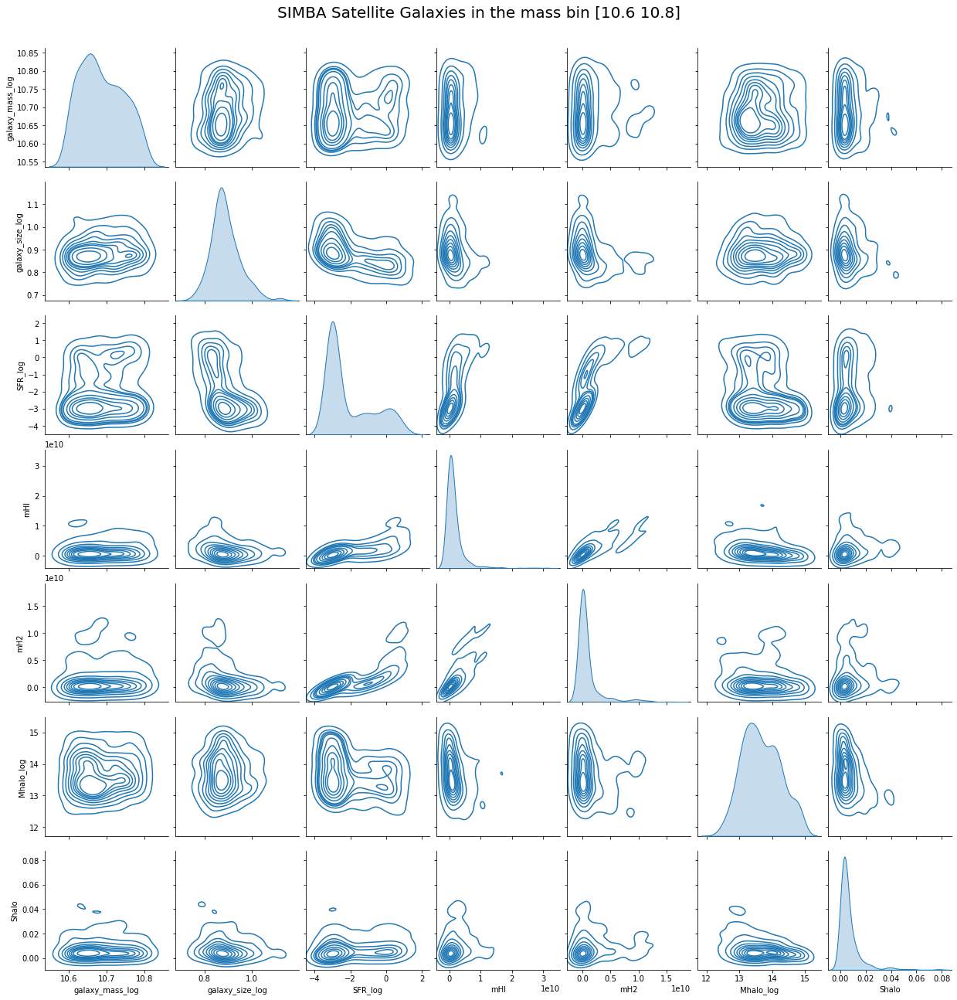

In [77]:
bin9=correlations_function(massbin_list[8:10], 'kde')

In [78]:
bin9[3].shape

(772, 7)

In [79]:
bin9[4].shape

(346, 7)

In [80]:
fig9_1 = bin9[0]
fig9_2=bin9[1]
fig9_3=bin9[2]
# fig9_1.savefig("bin9_SIMBA_central_satellite_scatter.jpeg", dpi=500 )
# fig9_2.savefig("bin9_SIMBA_central_pairplot.jpeg", dpi=500 )
# fig9_3.savefig("bin9_SIMBA_satellite_pairplot.jpeg", dpi=500 )

In [81]:
massbin_list[9:11]

array([10.8, 11. ])

(532, 7)
Galaxy Mass [$ M_\odot $]($ Log_10 $) 
 mass-size corr=0.17 
 SFR-size corr=-0.45 
 SFR-mass corr=-0.0


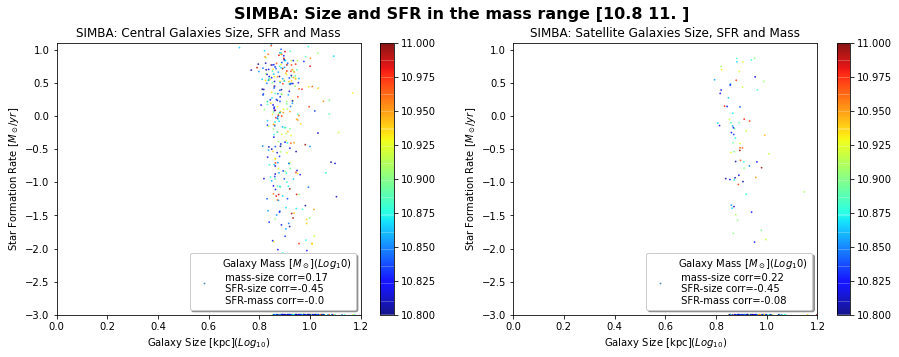

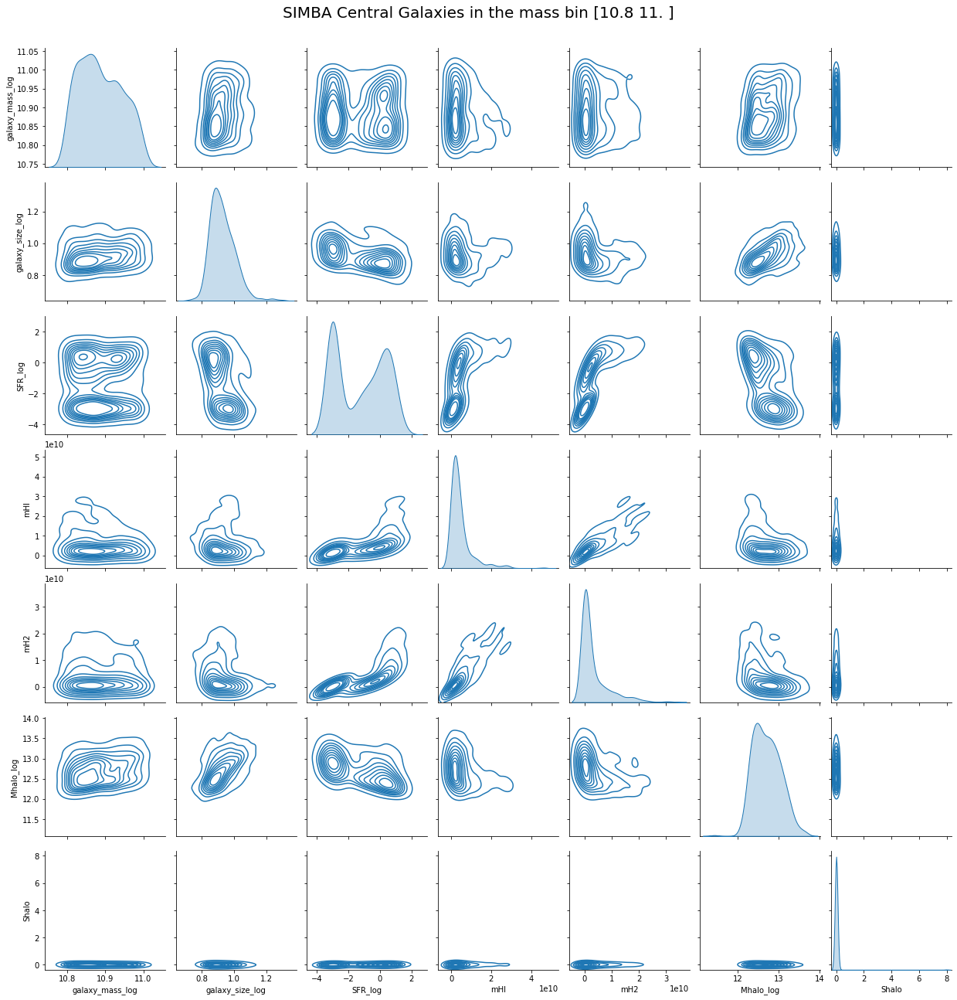

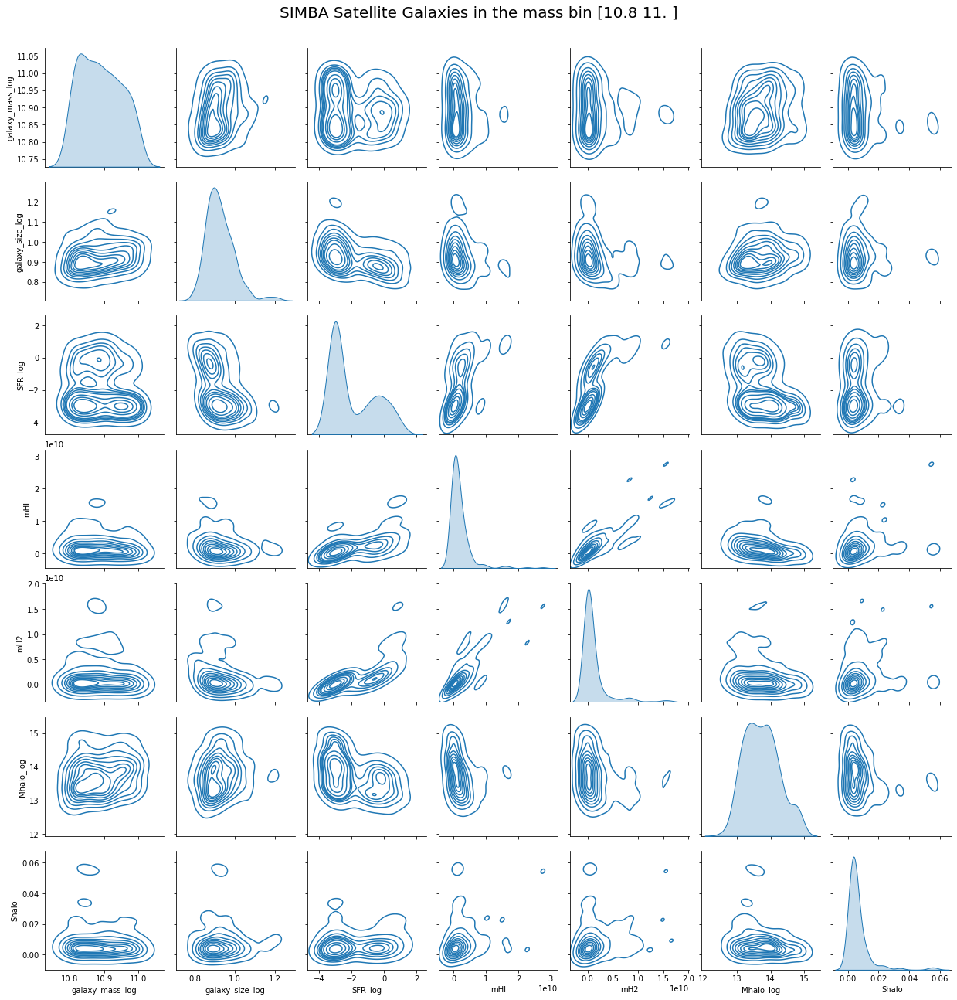

In [82]:
bin10=correlations_function(massbin_list[9:11], 'kde')

In [83]:
bin10[3].shape

(532, 7)

In [84]:
bin10[4].shape

(184, 7)

In [85]:
fig10_1 = bin10[0]
fig10_2=bin10[1]
fig10_3=bin10[2]
# fig10_1.savefig("bin10_SIMBA_central_satellite_scatter.jpeg", dpi=500 )
# fig10_2.savefig("bin10_SIMBA_central_pairplot.jpeg", dpi=500 )
# fig10_3.savefig("bin10_SIMBA_satellite_pairplot.jpeg", dpi=500 )

In [86]:
massbin_list[[0,10]]

array([ 9., 11.])

(23180, 7)
Galaxy Mass [$ M_\odot $]($ Log_10 $) 
 mass-size corr=0.9 
 SFR-size corr=-0.37 
 SFR-mass corr=-0.2


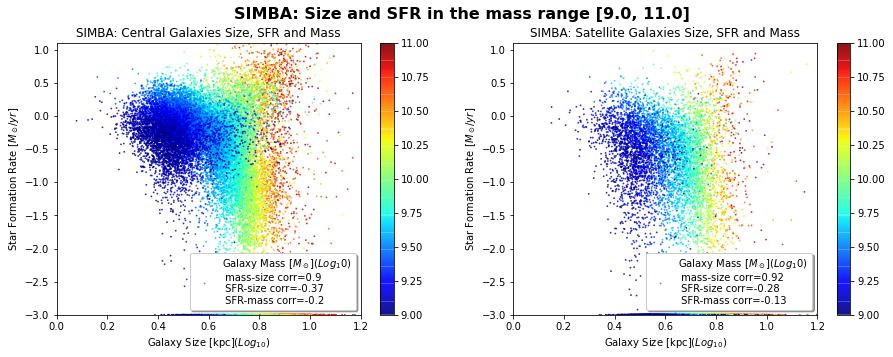

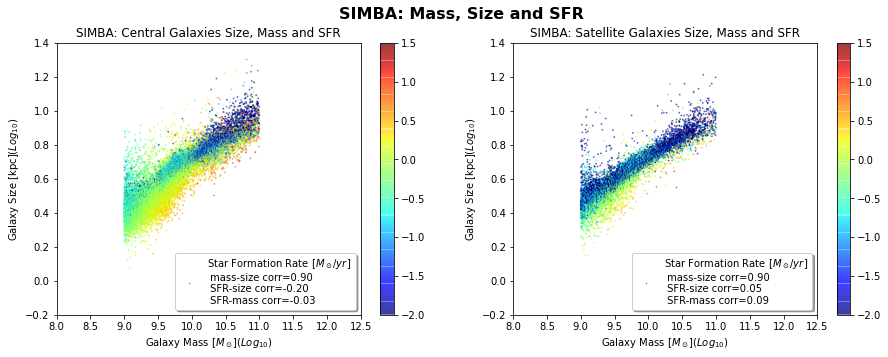

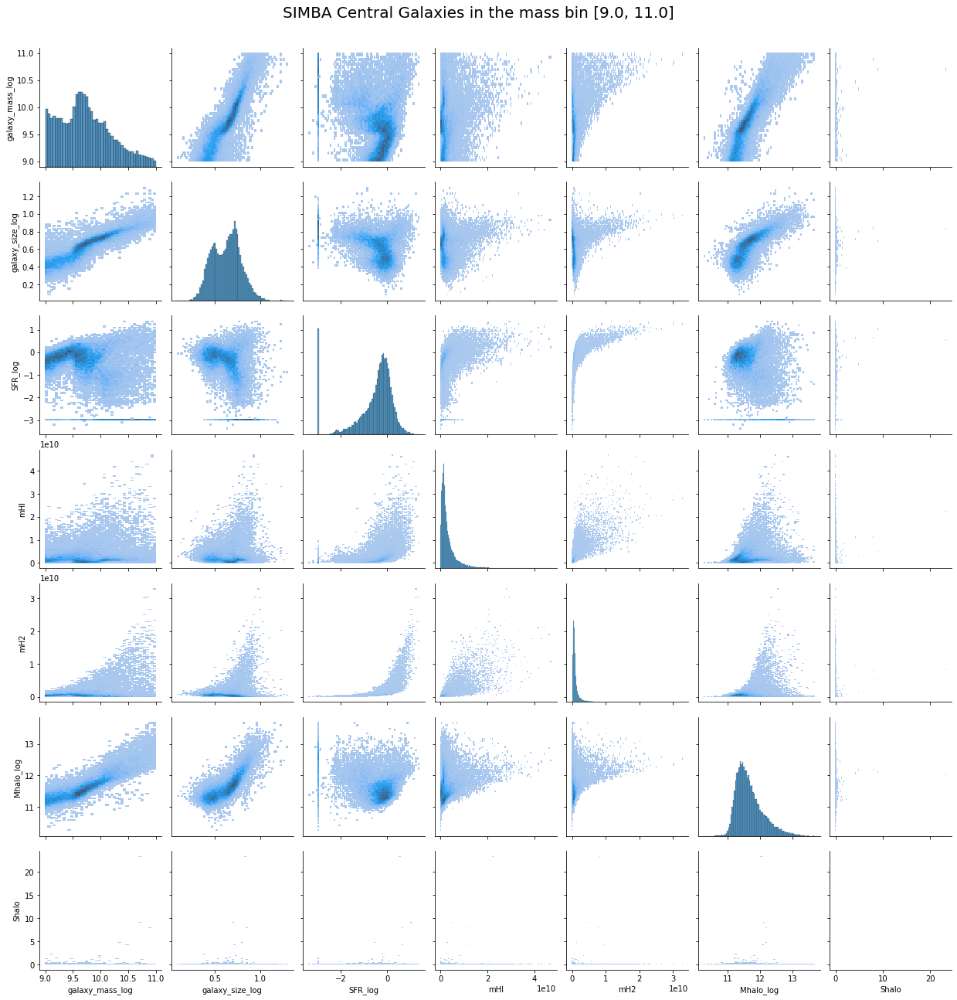

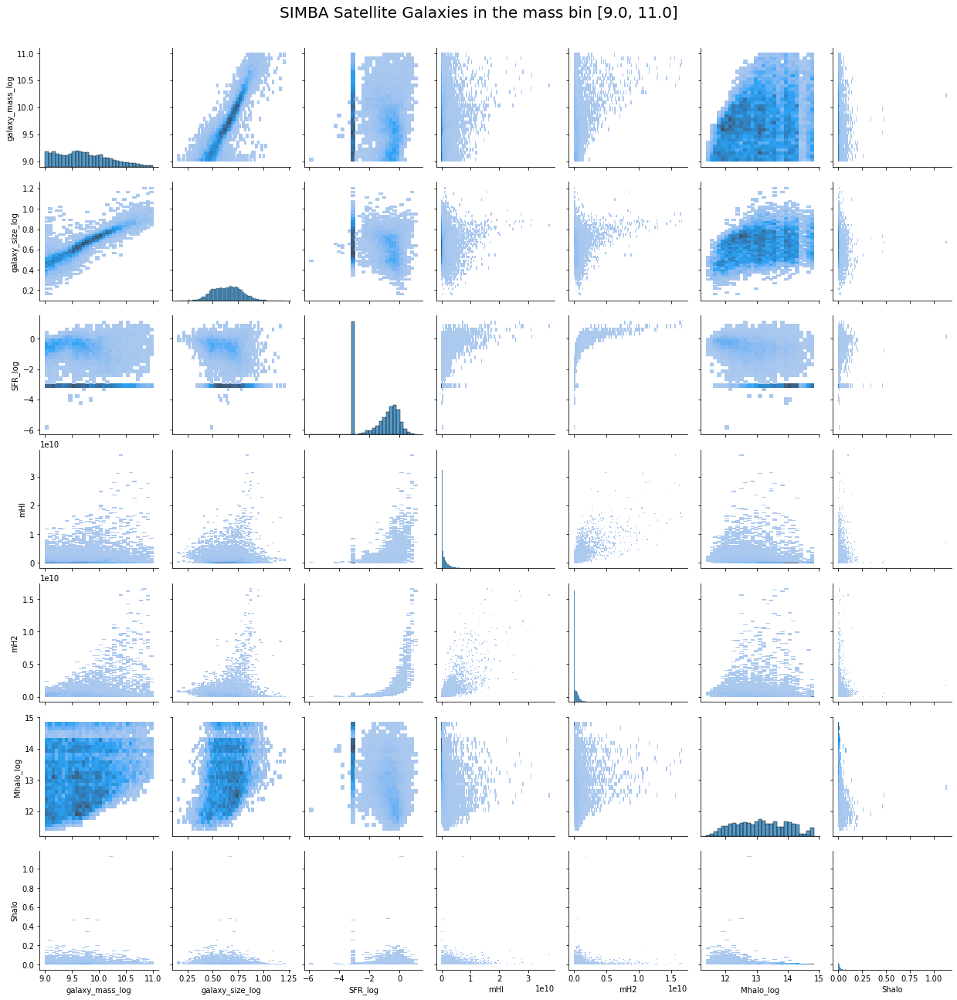

In [214]:
bin_total=correlations_function([9.0, 11.0], 'hist') # hist instead of kde for the large mass bin

In [88]:
bin_total[3].shape

(23180, 7)

In [89]:
bin_total[4].shape

(10766, 7)

In [90]:
fig_total_1 = bin_total[0]
fig_total_2=bin_total[1]
fig_total_3=bin_total[2]
# fig_total_1.savefig("bin_total_SIMBA_central_satellite_scatter.jpeg", dpi=500 )
# fig_total_2.savefig("bin_total_SIMBA_central_pairplot.jpeg", dpi=500 )
# fig_total_3.savefig("bin_total_SIMBA_satellite_pairplot.jpeg", dpi=500 )

In [91]:
df_SIMBA_largebin

,GID,central,galaxy_mass,galaxy_size,SFR,mHI,mH2,Mhalo,Shalo,galaxy_type,galaxy_mass_log,galaxy_size_log,SFR_log,Mhalo_log
735,735.0,0.0,9.978401e+10,7.970263,0.000000,3.298550e+01,0.000000e+00,3.313610e+13,0.003239,satellite,10.999061,0.901473,-3.000000,13.520301
736,736.0,1.0,9.968133e+10,8.307279,0.079241,2.241888e+09,4.848510e+08,4.305790e+12,0.001377,central,10.998614,0.919459,-1.101047,12.634053
737,737.0,1.0,9.962315e+10,7.784375,5.175782,3.281799e+09,5.633162e+09,2.117857e+12,0.004606,central,10.998360,0.891224,0.713976,12.325897
738,738.0,1.0,9.947884e+10,10.583336,0.000000,2.834171e+08,0.000000e+00,8.889494e+12,0.003644,central,10.997731,1.024623,-3.000000,12.948877
739,739.0,0.0,9.940144e+10,7.831544,0.302065,1.564607e+07,3.859709e+08,1.470235e+14,0.005288,satellite,10.997393,0.893847,-0.519900,14.167387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35055,35055.0,1.0,1.000201e+09,2.888276,0.351851,1.872441e+09,4.220126e+08,2.438126e+11,0.009271,central,9.000087,0.460639,-0.453642,11.387056
35056,35056.0,1.0,1.000186e+09,2.376561,0.302335,2.317558e+09,3.889491e+08,2.374264e+11,0.001151,central,9.000081,0.375949,-0.519512,11.375529
35057,35057.0,1.0,1.000132e+09,2.551879,0.470032,1.196789e+09,4.300261e+08,1.412381e+11,0.008856,central,9.000057,0.406860,-0.327873,11.149952
35058,35058.0,0.0,1.000049e+09,2.360012,0.085307,4.590993e+08,1.870599e+08,3.776023e+12,0.007250,satellite,9.000021,0.372914,-1.069016,12.577035


In [ ]:
import matplotlib.cm as cm
import matplotlib.colors as norm

fig4,[ax1, ax2]=plt.subplots(nrows=1,ncols=2,figsize=(15,5))
fig4.suptitle('SIMBA: Mass, Size and SFR', fontsize=16, fontweight='bold')

im1 = ax1.scatter(central_galaxies_mass, central_galaxies_size, 
                  c = (central_galaxies_SFR), cmap = plt.cm.jet, s=3, marker='.', alpha=0.5, vmin=-2, vmax=1.5,
                  label='Star Formation Rate [$M_\odot / yr$] \n mass-size corr=0.90 \n SFR-size corr=-0.20 \n SFR-mass corr=-0.03')
ax1.set_xlim([8.0, 12.5])
ax1.set_ylim([-0.2, 1.4])
ax1.set_title('SIMBA: Central Galaxies Size, Mass and SFR')
ax1.set_xlabel('Galaxy Mass [$ M_\odot $]($ Log_{10} $)')
ax1.set_ylabel('Galaxy Size [kpc]($ Log_{10} $)')
ax1.legend(loc='lower right', shadow=True)
fig4.colorbar(im1, ax=ax1)

im2 = ax2.scatter(satellite_galaxies_mass, satellite_galaxies_size, 
                  c = (satellite_galaxies_SFR), cmap = plt.cm.jet, s=3, marker='.', alpha=0.5, vmin=-2, vmax=1.5,
                  label='Star Formation Rate [$M_\odot / yr$] \n mass-size corr=0.90 \n SFR-size corr=0.05 \n SFR-mass corr=0.09')
ax2.set_xlim([8.0, 12.5])
ax2.set_ylim([-0.2, 1.4])
ax2.set_title('SIMBA: Satellite Galaxies Size, Mass and SFR')
ax2.set_xlabel('Galaxy Mass [$ M_\odot $]($ Log_{10} $)')
ax2.set_ylabel('Galaxy Size [kpc]($ Log_{10} $)')
ax2.legend(loc='lower right' , shadow=True)
fig4.colorbar(im2, ax=ax2)

#plt.savefig("SIMBA_central_satellite_SFR_Mstar9to11_v2.jpeg", dpi=500)
plt.show()

## SFR=0 to total SFR ratio

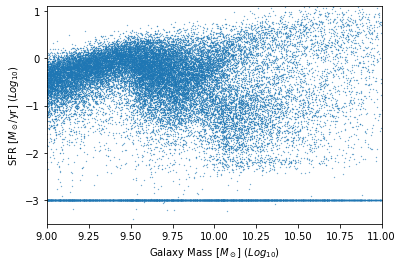

In [92]:
plt.scatter(df_SIMBA_largebin['galaxy_mass_log'], df_SIMBA_largebin['SFR_log'], s=0.3, marker='.')
plt.xlabel('Galaxy Mass [$M_\odot$] ($ Log_{10} $)')
plt.ylabel('SFR [$M_\odot$/yr] ($ Log_{10} $)')
plt.xlim([9.0, 11.0])
plt.ylim([-3.5, 1.1])
plt.savefig('SFR_vs_mass.jpeg', dpi=500)
plt.show()

In [93]:
massbin_list[:2]

array([9. , 9.2])

In [94]:
massbin= massbin_list[:2]

In [95]:
massbin_list[:-1]

array([ 9. ,  9.2,  9.4,  9.6,  9.8, 10. , 10.2, 10.4, 10.6, 10.8])

In [96]:
massbin_list[1:]

array([ 9.2,  9.4,  9.6,  9.8, 10. , 10.2, 10.4, 10.6, 10.8, 11. ])

In [97]:
df_SIMBA_largebin.loc[(df_SIMBA_largebin["galaxy_type"] == 'central') ,:].shape[0]

23180

In [98]:
df_SIMBA_largebin.loc[(df_SIMBA_largebin.SFR_log ==-3) & (df_SIMBA_largebin["galaxy_type"] == 'central') ,:].shape[0]

1474

In [99]:
55+49+66+97+126+210+224+207+235+205

1474

In [100]:
df = pd.DataFrame(columns= ['massbin', 'central_SFR_zero','central_SFR_zero/central_total',
                         'satellite_SFR_zero','satellite_SFR_zero/satellite_total'] )

In [101]:
df

,massbin,central_SFR_zero,central_SFR_zero/central_total,satellite_SFR_zero,satellite_SFR_zero/satellite_total


In [102]:
def SFR_ratios (massbin_list):
    '''This function provides the zero star formation to the total star formation ratio of galaxies
       in each stellar massbin on the massbin_list'''
    
    df = pd.DataFrame(columns= ['massbin', 'central_SFR_zero','central_SFR_zero/central_total',
                         'satellite_SFR_zero','satellite_SFR_zero/satellite_total'] ) # initially empty df
    
    for massbin in zip(massbin_list[:-1], massbin_list[1:]):
       

        df_SIMBA_bin = df_SIMBA_log.loc[(df_SIMBA_log.galaxy_mass_log>=massbin[0]) 
                                                  & (df_SIMBA_log.galaxy_mass_log<=massbin[1]), :] # define massbins

        central_SFR_zero=df_SIMBA_bin.loc[(df_SIMBA_bin.SFR_log ==-3) 
                                          & (df_SIMBA_bin["galaxy_type"] == 'central') ,:].shape[0] # number of central galaxies with SFR=0 (SFR_log=-3)   
        central_total=df_SIMBA_bin.loc[ (df_SIMBA_bin["galaxy_type"] == 'central') ,:].shape[0] # total number of central galaxies in the given massbin

        satellite_SFR_zero=df_SIMBA_bin.loc[(df_SIMBA_bin.SFR_log ==-3) 
                                          & (df_SIMBA_bin["galaxy_type"] == 'satellite') ,:].shape[0] # number of satellite galaxies with SFR=0 (SFR_log=-3)
        satellite_SFR_total=df_SIMBA_bin.loc[(df_SIMBA_bin["galaxy_type"] == 'satellite') ,:].shape[0] # total number of satellite galaxies in the given massbin


        df_SFR=pd.DataFrame({'massbin':massbin, 'central_SFR_zero': central_SFR_zero, 'central_SFR_zero/central_total': central_SFR_zero/central_total,
                         'satellite_SFR_zero': satellite_SFR_zero, 'satellite_SFR_zero/satellite_total' : satellite_SFR_zero/satellite_SFR_total})
        df = df.append(df_SFR.head(1))
    return df.reset_index(drop=True)

In [103]:
a=SFR_ratios(massbin_list)


In [104]:
massbin_list

array([ 9. ,  9.2,  9.4,  9.6,  9.8, 10. , 10.2, 10.4, 10.6, 10.8, 11. ])

In [105]:
a

,massbin,central_SFR_zero,central_SFR_zero/central_total,satellite_SFR_zero,satellite_SFR_zero/satellite_total
0,9.0,55,0.017188,578,0.333526
1,9.2,49,0.017229,487,0.347609
2,9.4,66,0.019236,590,0.364648
3,9.6,97,0.022106,555,0.324182
4,9.8,126,0.041944,463,0.345780
5,10.0,210,0.086634,478,0.416014
6,10.2,224,0.141682,390,0.502577
7,10.4,207,0.206175,275,0.541339
8,10.6,235,0.304404,212,0.612717
9,10.8,205,0.385338,107,0.581522


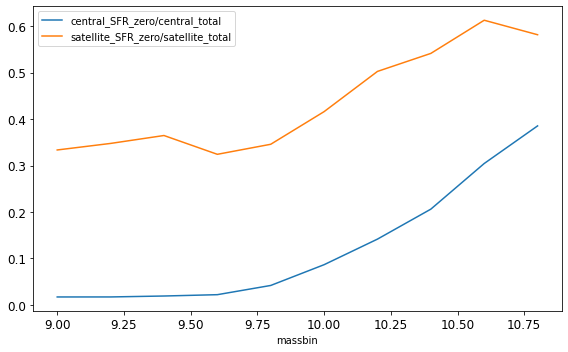

In [106]:

fig = a.plot('massbin', ['central_SFR_zero/central_total','satellite_SFR_zero/satellite_total'],  figsize=(8,5), fontsize=12).get_figure()

#fig.savefig('zero_SFR_ratio_to_total.jpeg', dpi=500)
fig.tight_layout()


### <font color='blue'> Linear Regression Model

In [108]:
df_SIMBA_log.columns

Index(['GID', 'central', 'galaxy_mass', 'galaxy_size', 'SFR', 'mHI', 'mH2',
       'Mhalo', 'Shalo', 'galaxy_type', 'galaxy_mass_log', 'galaxy_size_log',
       'SFR_log', 'Mhalo_log'],
      dtype='object')

In [137]:
x = df_SIMBA_log.loc[:,['galaxy_mass_log', 'SFR', 'mHI', 'mH2', 'Mhalo_log', 'Shalo']]
X = sm.add_constant(x)


y = df_SIMBA_log.loc[:,'galaxy_size_log']

import statsmodels.api as sm
import numpy as np

model = sm.OLS(y,X)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        galaxy_size_log   R-squared:                       0.762
Model:                            OLS   Adj. R-squared:                  0.762
Method:                 Least Squares   F-statistic:                 2.918e+04
Date:                Wed, 01 Dec 2021   Prob (F-statistic):               0.00
Time:                        15:59:15   Log-Likelihood:                 54411.
No. Observations:               54802   AIC:                        -1.088e+05
Df Residuals:                   54795   BIC:                        -1.087e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -1.9397      0.007   -292.090      0.000      -1.953      -1.927
galaxy_mass_log     0.2172      0.001    334.826      0.000       0.216       0.218
SFR                -0.0527      0.001    -64.990      0.000      -0.054      -0.051
mHI              5.052e-12   1.72e-13     29.411      0.000    4.71e-12    5.39e-12
mH2              1.829e-11   5.56e-13     32.913      0.000    1.72e-11    1.94e-11
Mhalo_log           0.0381      0.000     92.319      0.000       0.037       0.039
Shalo            6.058e-05      0.003      0.019      0.985      -0.006       0.006
==============================================================================
Omnibus:                     8158.242   Durbin-Watson:                   1.830
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            27633.328
Skew:                           0.751   Prob(JB):                         0.00
Kurtosis:                       6.138   Cond. No.                     7.25e+10
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.25e+10. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

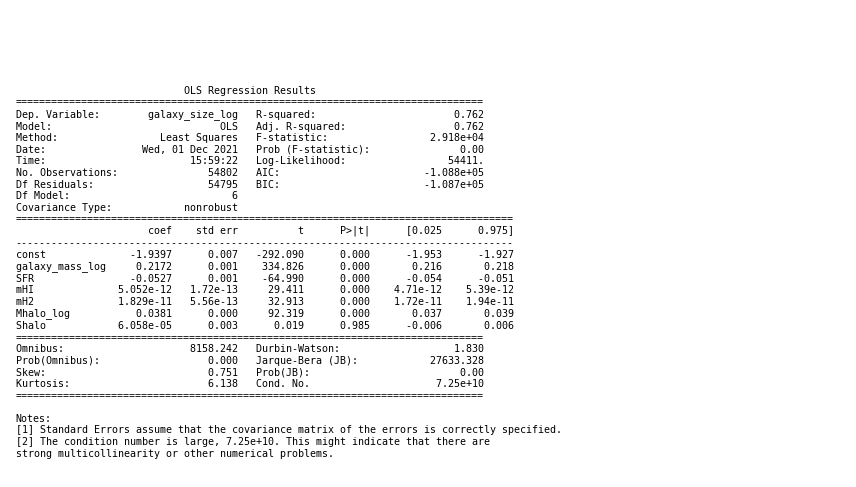

In [138]:
plt.rc('figure', figsize=(12, 7))
#plt.text(0.01, 0.05, str(model.summary()), {'fontsize': 12}) old approach
plt.text(0.01, 0.05, str(results.summary()), {'fontsize': 10}, fontproperties = 'monospace') # approach improved by OP -> monospace!
plt.axis('off')
plt.tight_layout()
# plt.savefig('OLS_v1.jpeg', dpi=500)

In [131]:
X.corr()[X.corr()>.2]

,const,galaxy_mass_log,SFR,mHI,mH2,Mhalo_log,Shalo
const,NaN,NaN,NaN,NaN,NaN,NaN,NaN
galaxy_mass_log,NaN,1.000000,0.289516,0.232208,0.350997,0.261415,NaN
SFR,NaN,0.289516,1.000000,0.567452,0.854624,NaN,NaN
mHI,NaN,0.232208,0.567452,1.000000,0.700280,NaN,NaN
mH2,NaN,0.350997,0.854624,0.700280,1.000000,NaN,NaN
Mhalo_log,NaN,0.261415,NaN,NaN,NaN,1.000000,NaN
Shalo,NaN,NaN,NaN,NaN,NaN,NaN,1.0


In [139]:
x = df_SIMBA_log.loc[:,[ 'SFR', 'mHI', 'mH2', 'Mhalo_log', 'Shalo']]
X = sm.add_constant(x)


y = df_SIMBA_log.loc[:,'galaxy_size_log']

import statsmodels.api as sm
import numpy as np

model = sm.OLS(y,X)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        galaxy_size_log   R-squared:                       0.274
Model:                            OLS   Adj. R-squared:                  0.274
Method:                 Least Squares   F-statistic:                     4135.
Date:                Wed, 01 Dec 2021   Prob (F-statistic):               0.00
Time:                        15:59:43   Log-Likelihood:                 23892.
No. Observations:               54802   AIC:                        -4.777e+04
Df Residuals:                   54796   BIC:                        -4.772e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.4197      0.008    -49.615      0.000      -0.436      -0.403
SFR           -0.0475      0.001    -33.591      0.000      -0.050      -0.045
mHI         7.344e-12      3e-13     24.519      0.000    6.76e-12    7.93e-12
mH2         4.521e-11    9.6e-13     47.097      0.000    4.33e-11    4.71e-11
Mhalo_log      0.0786      0.001    114.193      0.000       0.077       0.080
Shalo         -0.0019      0.005     -0.339      0.734      -0.013       0.009
==============================================================================
Omnibus:                      156.043   Durbin-Watson:                   0.876
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              155.154
Skew:                           0.122   Prob(JB):                     2.04e-34
Kurtosis:                       2.907   Cond. No.                     5.29e+10
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.29e+10. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

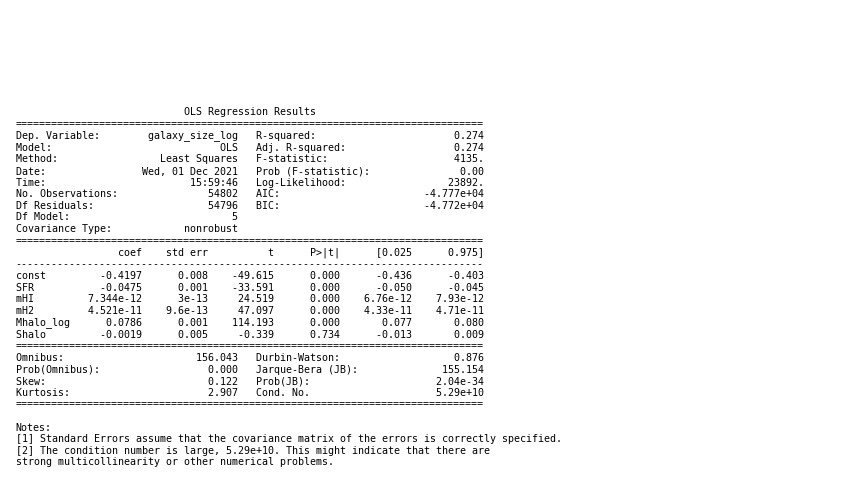

In [140]:
plt.rc('figure', figsize=(12, 7))
#plt.text(0.01, 0.05, str(model.summary()), {'fontsize': 12}) old approach
plt.text(0.01, 0.05, str(results.summary()), {'fontsize': 10}, fontproperties = 'monospace') # approach improved by OP -> monospace!
plt.axis('off')
plt.tight_layout()
# plt.savefig('OLS_v2.jpeg', dpi=500)

### <font color='blue'> Random Forest Model

In [169]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)
regr = RandomForestRegressor(max_depth=10, random_state=0)
regr.fit(X_train, y_train)

RandomForestRegressor(max_depth=10, random_state=0)

In [152]:
y_pred = regr.predict(X_test)

In [151]:
regr.score(X_test, y_test)

0.6716650627629785

(0.0, 1.5, 0.0, 1.5)

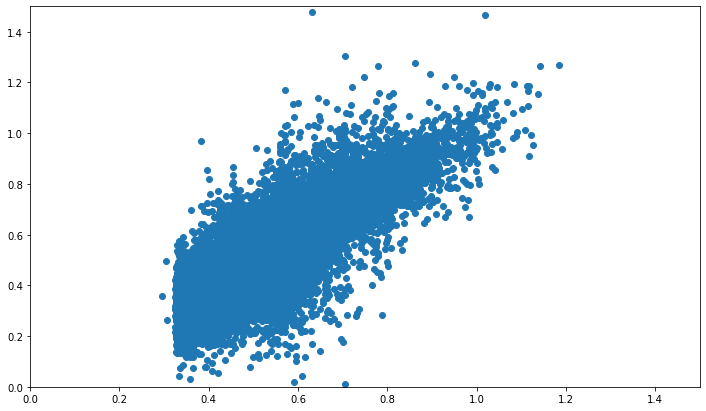

In [164]:
plt.scatter(y_pred, y_test)
plt.axis([0,1.5, 0,1.5])
# # plt.ylim((0,1.5))
# plt.xlim((0,1.5))

In [172]:
from sklearn.model_selection import RandomizedSearchCV
random_grid = {'bootstrap': [True, False],
               'max_depth': [5, 10, None],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [130, 180, 230]}
rf = RandomForestRegressor()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 10, cv = 3, verbose=2, random_state=0, n_jobs = -1)
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 50, 100, 110, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [130, 180, 230]},
                   random_state=0, verbose=2)

In [173]:
cv_results = rf_random.cv_results_

In [174]:
cv_results

{'mean_fit_time': array([22.96925004, 32.83389203, 31.71786896, 24.4887406 , 12.45369458,
        46.45588795, 25.89657593, 24.67094835, 31.37818193,  9.08597445]),
 'std_fit_time': array([0.07919343, 2.42902306, 0.70214262, 0.4844087 , 0.04157724,
        3.009353  , 0.07392238, 0.15994008, 1.28861296, 0.52720994]),
 'mean_score_time': array([0.50109466, 0.66098452, 0.54543241, 0.54412492, 0.62272493,
        0.78800766, 0.45709467, 0.48918088, 0.43669788, 0.3801322 ]),
 'std_score_time': array([0.01231661, 0.10770488, 0.09514001, 0.03482076, 0.00716017,
        0.00986669, 0.0130562 , 0.01536452, 0.06183305, 0.02960721]),
 'param_n_estimators': masked_array(data=[230, 180, 180, 230, 230, 230, 130, 230, 180, 180],
              mask=[False, False, False, False, False, False, False, False,
                    False, False],
        fill_value='?',
             dtype=object),
 'param_min_samples_split': masked_array(data=[10, 5, 10, 10, 5, 5, 2, 5, 5, 10],
              mask=[False, Fal

In [180]:
rf_random.best_estimator_.score(X_test,y_test)

0.6835667370455791

### Feature Importances MDI

In [182]:
import time

start_time = time.time()
importances = regr.feature_importances_
std = np.std([tree.feature_importances_ for tree in regr.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

Elapsed time to compute the importances: 0.028 seconds


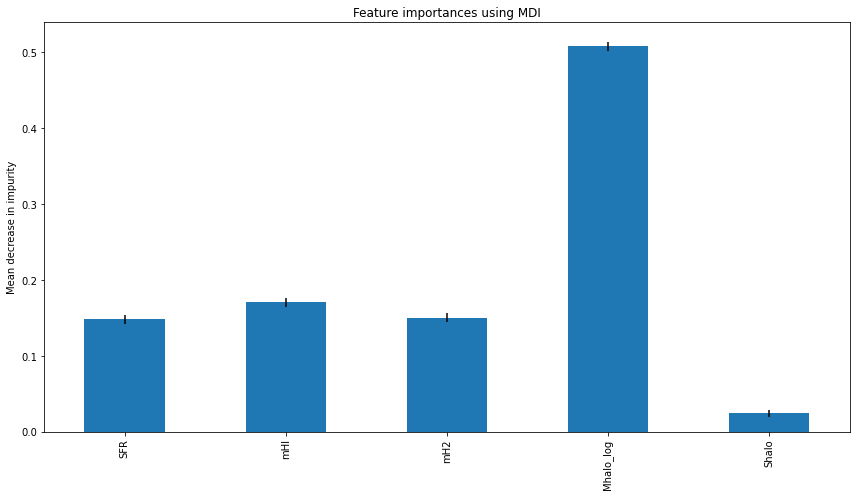

In [187]:
feature_names = x.columns

forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [188]:
x

,SFR,mHI,mH2,Mhalo_log,Shalo
1,32.495613,4.860084e+09,2.554619e+10,14.646882,0.002251
2,0.000000,4.645089e+09,2.795169e+08,14.839074,0.002041
4,0.000000,2.346815e+09,2.084681e+08,14.149211,0.003263
5,0.000000,4.524431e+09,2.510553e+08,14.806477,0.003573
6,2.469266,4.631708e+09,1.976497e+09,14.172917,0.003232
...,...,...,...,...,...
55604,0.000000,1.703623e+00,0.000000e+00,14.036625,0.012787
55605,0.000000,3.065291e-02,0.000000e+00,14.806477,0.003573
55606,0.000000,1.451338e-01,0.000000e+00,14.839074,0.002041
55607,0.000000,0.000000e+00,0.000000e+00,13.840724,0.003264


### Feature Importances Permutation

In [191]:
from sklearn.inspection import permutation_importance

start_time = time.time()
result = permutation_importance(
    regr, X_test, y_test, n_repeats=10, random_state=0, n_jobs=-1
)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(result.importances_mean, index=feature_names)

Elapsed time to compute the importances: 2.658 seconds


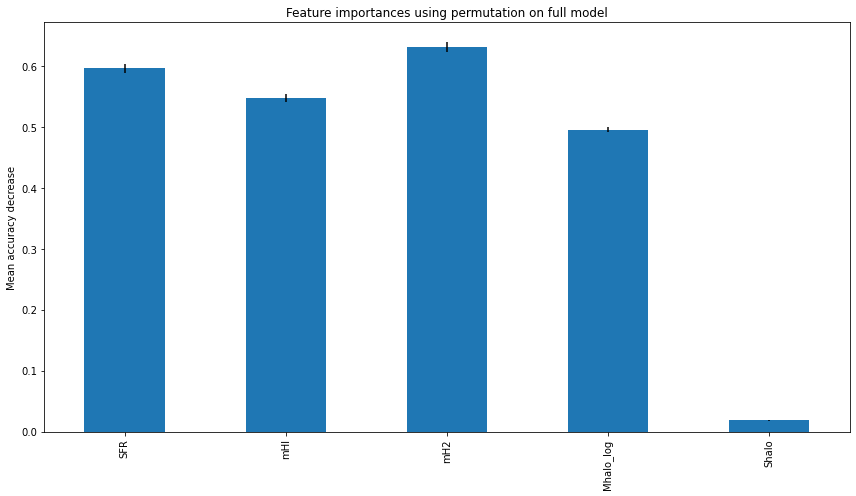

In [192]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()